In [4]:
import pandas as pd
import zipfile
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.ndimage


# Load data from zip file
zip_path = "data/dmc_122124.zip"
zip_path = "data/dmc_122724.zip"
zip_path = "data/dmc_010225.zip"
records = []

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    for filename in zip_ref.namelist():
        if filename.endswith('.npy'):
            # Extract parameters from directory name (e.g. BRO_64_1_3e-4)
            env_name = filename.split('/')[2].split('.')[0]  # Get environment name from path
            name = filename.split('/')[1]
            params = name.split('_')
            batch_size = int(params[1])
            utd = int(params[2])
            learning_rate = float(params[3])
            # Load array data
            with zip_ref.open(filename) as f:
                arr = np.load(f)
                
            # Create record with metadata and results
            records.append({
                'env_name': env_name,
                'batch_size': batch_size,
                'utd': utd,
                'learning_rate': learning_rate,
                'training_step': arr[:, 0],
                'return': arr[:, 1:],
                'mean_return': np.mean(arr[:, 1:], axis=1),  # Add summary statistics
                # 'mean_return': arr[:, 1],
                'std_return': np.std(arr[:, 1:], axis=1) / np.sqrt(10)  # Standard Error of Mean over 10 seeds
            })

# Convert to pandas DataFrame
df = pd.DataFrame(records)

smoothing = {('dog-stand', 1): 30, ('reacher-easy', 1): 10, ('hopper-stand', 1): 30, ('finger-spin', 1): 10, ('quadruped-walk', 1): 30, ('walker-walk', 1): 5, ('humanoid-stand', 1): 30,
             ('dog-stand', 2): 30, ('reacher-easy', 2): 10, ('hopper-stand', 2): 30, ('finger-spin', 2): 10, ('quadruped-walk', 2): 30, ('walker-walk', 2): 5, ('humanoid-stand', 2): 30, 
             ('dog-stand', 4): 30, ('reacher-easy', 4): 10, ('hopper-stand', 4): 30, ('finger-spin', 4): 10, ('quadruped-walk', 4): 30, ('walker-walk', 4): 5, ('humanoid-stand', 4): 30,
             ('dog-stand', 8): 30, ('reacher-easy', 8): 10, ('hopper-stand', 8): 20, ('finger-spin', 8): 5, ('quadruped-walk', 8): 15, ('walker-walk', 8): 5, ('humanoid-stand', 8): 30}

# Calculate crossings for each threshold and store in array
thresholds = [100, 200, 300, 400, 500, 600, 700, 800]
# crossings_array = []
# for _, row in df.iterrows():
#     row_crossings = []
#     for threshold in thresholds:
#         # Find indices where mean return crosses the threshold
#         crossing_idx = np.mean(np.where(np.diff(np.signbit(np.array(row['mean_return']) - threshold))), axis=1).astype(int)
#         # Convert index to training step value
#         if crossing_idx >= 0:
#             crossing_step = row['training_step'][crossing_idx[0]]
#             row_crossings.append(crossing_step)
#         else:
#             row_crossings.append(np.nan)
#     crossings_array.append(row_crossings)
# df['crossings'] = crossings_array

crossings_array = []
crossings_sem_array = []
for _, row in df.iterrows():
    row_crossings = []
    row_crossings_sem = []
    for threshold in thresholds:
        # Find indices where each seed's return crosses the threshold
        seed_crossings = []
        for seed_returns in row['return'].T:  # Transpose to iterate over seeds
            # smooth_returns = scipy.ndimage.gaussian_filter1d(seed_returns, smoothing[row['env_name'], row['utd']])
            smooth_returns = scipy.ndimage.gaussian_filter1d(seed_returns, 5)
            crossing_idx = np.median(np.where(np.diff(np.signbit(smooth_returns - threshold))), axis=1).astype(int)
            # crossing_idx = np.median(np.where(np.diff(np.signbit(np.array(row['mean_return']) - threshold))), axis=1).astype(int) # note - this is sensitive to noise, use crossings after averaging
            seed_crossings.append(row['training_step'][crossing_idx][0] if crossing_idx > 0 else np.nan)

        # Calculate mean and standard error of crossing points across seeds
        seed_crossings = np.array(seed_crossings)
        sem_crossing = np.nanstd(seed_crossings) / np.sqrt(np.sum(~np.isnan(seed_crossings))) if np.sum(~np.isnan(seed_crossings)) > 1 else np.nan
        row_crossings_sem.append(sem_crossing)

        # get mean separately
        # mean_crossing = seed_crossings[0]
        # mean_crossing = np.median(seed_crossings)
        # row_crossings.append(mean_crossing)
        mean_crossing_idx = np.median(np.where(np.diff(np.signbit(np.array(row['mean_return']) - threshold))), axis=1).astype(int) # note - this is sensitive to noise, use crossings after averaging
        row_crossings.append(row['training_step'][mean_crossing_idx][0] if mean_crossing_idx > 0 else np.nan)
    
    crossings_array.append(row_crossings)
    crossings_sem_array.append(row_crossings_sem)

df['crossings'] = crossings_array
df['crossings_sem'] = crossings_sem_array

# change 1.2e-2 to 1.2e-3
df['learning_rate'] = df['learning_rate'].replace(1.2e-2, 1.2e-3)

df

/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/numpy/core/_methods.py:182: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


,env_name,batch_size,utd,learning_rate,training_step,return,mean_return,std_return,crossings,crossings_sem
0,dog-stand,64,8,0.00015,"[5000.0, 6000.0, 7000.0, 8000.0, 9000.0, 10000...","[[0.012786157760283771, 0.008792589896180762, ...","[0.009076612890084036, 20.560380677249054, 20....","[0.0023219206751776598, 1.3897536796960757, 1....","[46000.0, 88000.0, 125000.0, 171000.0, 205000....","[3655.680511204446, 5425.4953690884295, 5028.0..."
1,walker-walk,64,8,0.00015,"[5000.0, 6000.0, 7000.0, 8000.0, 9000.0, 10000...","[[0.018847886657658925, 0.020843590398092082, ...","[0.03329333808196155, 33.932157138805245, 35.1...","[0.005787185284612981, 1.602412433259457, 1.70...","[10000.0, 14000.0, 18000.0, 21000.0, 23000.0, ...","[327.75276505317237, 1131.8127053536728, 1407...."
2,reacher-easy,64,8,0.00015,"[5000, 6000, 7000, 8000, 9000, 10000, 11000, 1...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [119, 0, 303,...","[0.0, 111.2, 212.1, 255.3, 577.6, 126.6, 197.1...","[0.0, 65.69745809390191, 101.81114379084443, 1...","[nan, 9000, 11000, 11000, 9000, 20000, 24000, ...","[2596.293654566205, 1367.6148472323525, 1402.7..."
3,hopper-stand,64,8,0.00015,"[5000.0, 6000.0, 7000.0, 8000.0, 9000.0, 10000...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[0.0, 1.0712729879328584, 2.4090577922881935, ...","[0.0, 1.0162987913045725, 1.6042998125899615, ...","[47000.0, 55000.0, 64000.0, 65000.0, 84000.0, ...","[8514.751904782663, 16966.908970110024, 16586...."
4,humanoid-stand,64,8,0.00015,"[5000.0, 6000.0, 7000.0, 8000.0, 9000.0, 10000...","[[1.5385601715506798e-14, 7.656908871069451e-1...","[4.480374819187928e-14, 3.3231040643310124, 4....","[1.9703600814575946e-14, 0.7156780348267542, 0...","[133000.0, 166000.0, 201000.0, 238000.0, 29400...","[14024.83511489529, 14479.502753893172, 16280...."
...,...,...,...,...,...,...,...,...,...,...
443,reacher-easy,64,4,0.00015,"[5000, 6000, 7000, 8000, 9000, 10000, 11000, 1...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [140, 51, 308...","[0.0, 67.8, 219.3, 177.9, 198.5, 312.3, 669.8,...","[0.0, 32.004624665819776, 89.02483361399783, 1...","[6000, 7000, 9000, 15000, 18000, 24000, 27000,...","[nan, 1939.0719429665317, 1322.8756555322952, ..."
444,hopper-stand,64,4,0.00015,"[5000.0, 6000.0, 7000.0, 8000.0, 9000.0, 10000...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[0.0, 0.8849951350214326, 1.5957668091084163, ...","[0.0, 0.8395801034507924, 1.060277741720028, 1...","[46000.0, 52000.0, 55000.0, 65000.0, 85000.0, ...","[8058.7840273827915, 8414.273587185051, 8979.3..."
445,humanoid-stand,64,4,0.00015,"[5000.0, 6000.0, 7000.0, 8000.0, 9000.0, 10000...","[[1.117692529376728e-12, 9.166600739930574e-15...","[1.964117261768689e-13, 3.020148727866962, 4.1...","[1.069912807058379e-13, 0.7204837926992456, 0....","[156000.0, 177000.0, 209000.0, 243000.0, 28300...","[9147.895932945456, 9480.980961904734, 11411.7..."
446,finger-spin,64,4,0.00015,"[5000, 6000, 7000, 8000, 9000, 10000, 11000, 1...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 2, 0, ...","[0.0, 0.2, 0.5, 0.0, 0.5, 1.5, 7.7, 7.0, 35.1,...","[0.0, 0.18973665961010278, 0.4743416490252569,...","[16000, 19000, 24000, 27000, 31000, 35000, 420...","[1442.5671561490647, 1405.7026712644463, 1435...."


In [3]:
# plot curves

colors = sns.color_palette("viridis", n_colors=8)  # Using viridis for a nice gradient
fig, axs = plt.subplots(4, 7, figsize=(25, 12))
fig.suptitle('Learning Curves by Environment and UTD Ratio')

lines = []
labels = []
config_colors = {}
color_idx = 0

df_filtered = df[df['batch_size'] == 64]
df_filtered = df
# df_filtered = df_filtered[df_filtered['learning_rate'] == 3e-4]

# Group data by environment and UTD ratio
for i, env in enumerate(df['env_name'].unique()):
    env_data = df_filtered[df_filtered['env_name'] == env]
    
    # Create separate plots for each UTD value
    for j, utd in enumerate(env_data['utd'].unique()):
        utd_data = env_data[env_data['utd'] == utd]
        # Sort by batch size and learning rate
        utd_data = utd_data.sort_values(['utd', 'batch_size', 'learning_rate'])
        
        ax = axs[j, i]
        ax.set_title(f'{env} (UTD={utd})')
        
        for _, row in utd_data.iterrows():
            config = (row['batch_size'], row['learning_rate'])
            if config not in config_colors:
                config_colors[config] = color_idx
                color_idx += 1
            
            label = f"bs={row['batch_size']}, lr={row['learning_rate']}"
            line = ax.plot(row['training_step'], row['mean_return'], alpha=0.3, color=colors[config_colors[config] % len(colors)])
            results = scipy.ndimage.gaussian_filter1d(row['mean_return'], smoothing[env, row['utd']])
            line = ax.plot(row['training_step'], results, alpha=1, color=colors[config_colors[config] % len(colors)])

            # use the crossings column to plot crossings
            for k, threshold in enumerate(thresholds):
                crossing_x = row['crossings'][k]
                crossing_y = threshold
                ax.plot(crossing_x, crossing_y, 'o', color=colors[config_colors[config] % len(colors)])
            
            # Only add to legend if we haven't seen this combination before
            if label not in labels:
                lines.append(line[0])
                labels.append(label)
        
        ax.set_xlabel('Steps')
        ax.set_ylabel('Return')
        ax.grid(True)
        
        # Set background color
        ax.set_facecolor('#f0f0f0')

# Sort labels by batch size and learning rate
sorted_indices = [i for i, _ in sorted(enumerate(labels), 
                                     key=lambda x: tuple(map(float, x[1].replace("bs=","").replace("lr=","").split(", "))))]
lines = [lines[i] for i in sorted_indices]
labels = [labels[i] for i in sorted_indices]

# Create a single legend outside all subplots
fig.legend(lines, labels, bbox_to_anchor=(0.5, 0), loc='upper center', ncol=(len(labels) // 3)+1, fontsize=12)
plt.tight_layout()
plt.show()

NameError: name 'sns' is not defined

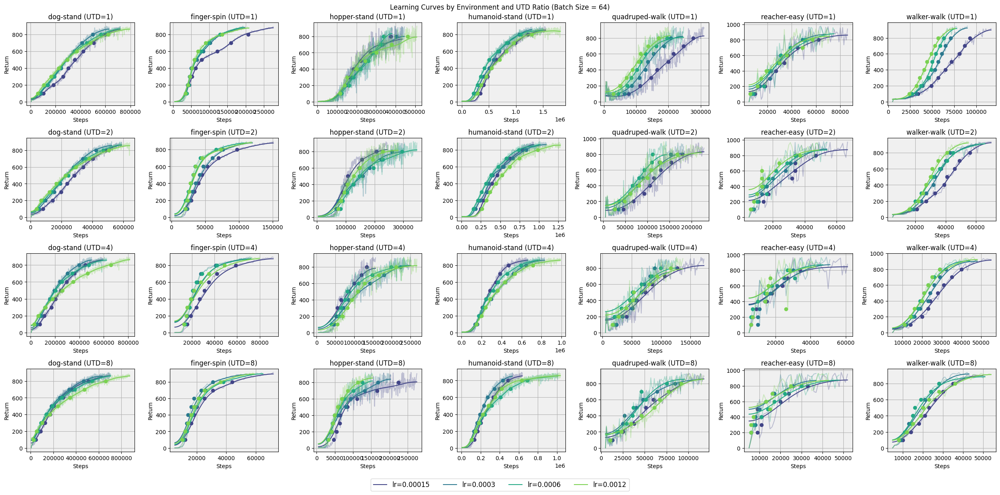

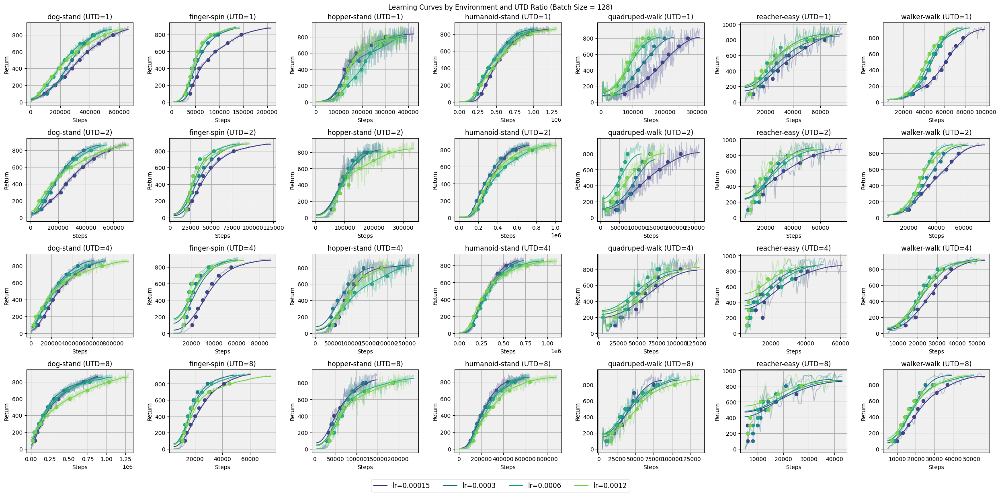

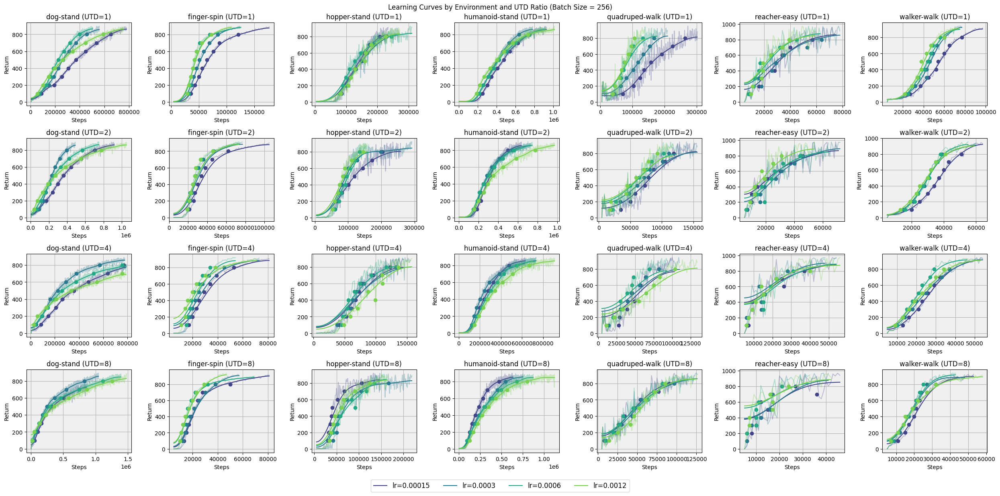

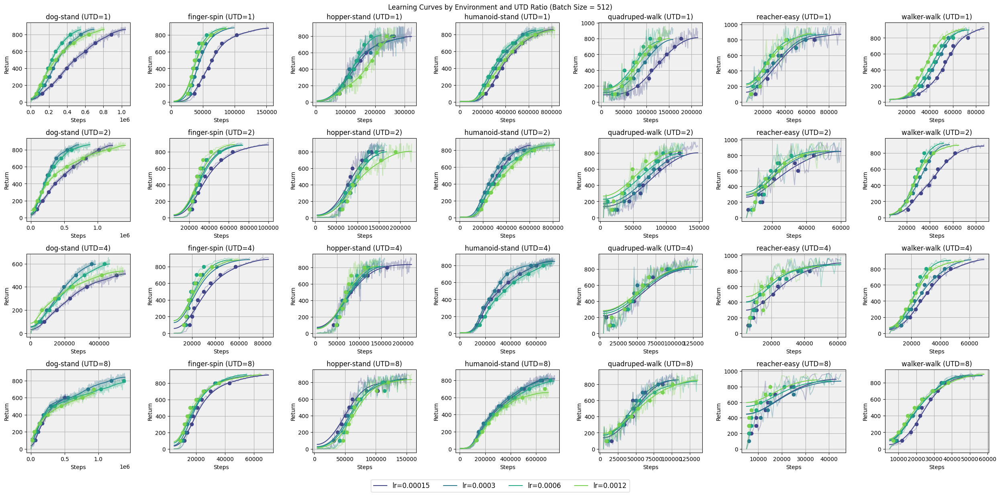

In [39]:
# plot curves

import matplotlib.pyplot as plt
import seaborn as sns

# Get unique batch sizes
batch_sizes = sorted(df['batch_size'].unique())

# Create a separate plot for each batch size
for batch_size in batch_sizes:
    colors = sns.color_palette("viridis", n_colors=4)  # Using viridis for a nice gradient
    fig, axs = plt.subplots(4, 7, figsize=(25, 12))
    fig.suptitle(f'Learning Curves by Environment and UTD Ratio (Batch Size = {batch_size})')

    lines = []
    labels = []
    config_colors = {}
    color_idx = 0

    # Filter data for current batch size
    df_filtered = df[df['batch_size'] == batch_size]

    # Group data by environment and UTD ratio
    for i, env in enumerate(sorted(df['env_name'].unique())):
        env_data = df_filtered[df_filtered['env_name'] == env]
        
        # Create separate plots for each UTD value
        for j, utd in enumerate(sorted(env_data['utd'].unique())):
            utd_data = env_data[env_data['utd'] == utd]
            # Sort by learning rate only since we're already filtering by UTD
            utd_data = utd_data.sort_values('learning_rate')
            
            ax = axs[j, i]
            ax.set_title(f'{env} (UTD={utd})')
            
            for _, row in utd_data.iterrows():
                config = row['learning_rate']
                if config not in config_colors:
                    config_colors[config] = color_idx
                    color_idx += 1
                
                label = f"lr={row['learning_rate']}"
                line = ax.plot(row['training_step'], row['mean_return'], alpha=0.3, color=colors[config_colors[config] % len(colors)])
                results = scipy.ndimage.gaussian_filter1d(row['mean_return'], smoothing[env, row['utd']])
                line = ax.plot(row['training_step'], results, alpha=1, color=colors[config_colors[config] % len(colors)])
                
                # use the crossings column to plot crossings
                for k, threshold in enumerate(thresholds):
                    crossing_x = row['crossings'][k]
                    crossing_y = threshold
                    ax.plot(crossing_x, crossing_y, 'o', color=colors[config_colors[config] % len(colors)])

                # Only add to legend if we haven't seen this combination before
                if label not in labels:
                    lines.append(line[0])
                    labels.append(label)
            
            ax.set_xlabel('Steps')
            ax.set_ylabel('Return')
            ax.grid(True)
            
            # Set background color
            ax.set_facecolor('#f0f0f0')

    # Sort labels by learning rate
    sorted_indices = [i for i, _ in sorted(enumerate(labels), 
                                         key=lambda x: float(x[1].replace("lr=","")))]
    lines = [lines[i] for i in sorted_indices]
    labels = [labels[i] for i in sorted_indices]

    # Create a single legend outside all subplots
    fig.legend(lines, labels, bbox_to_anchor=(0.5, 0), loc='upper center', ncol=(len(labels)), fontsize=12)
    plt.tight_layout()
    plt.show()

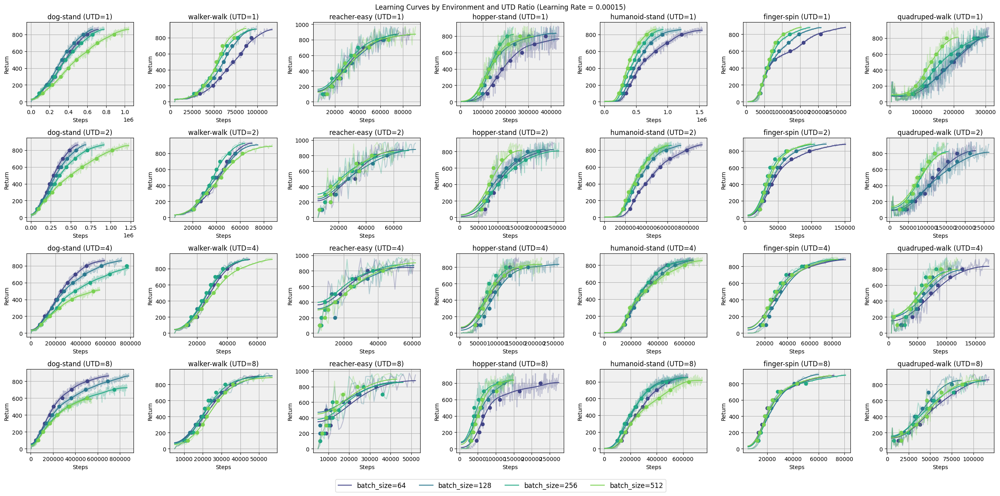

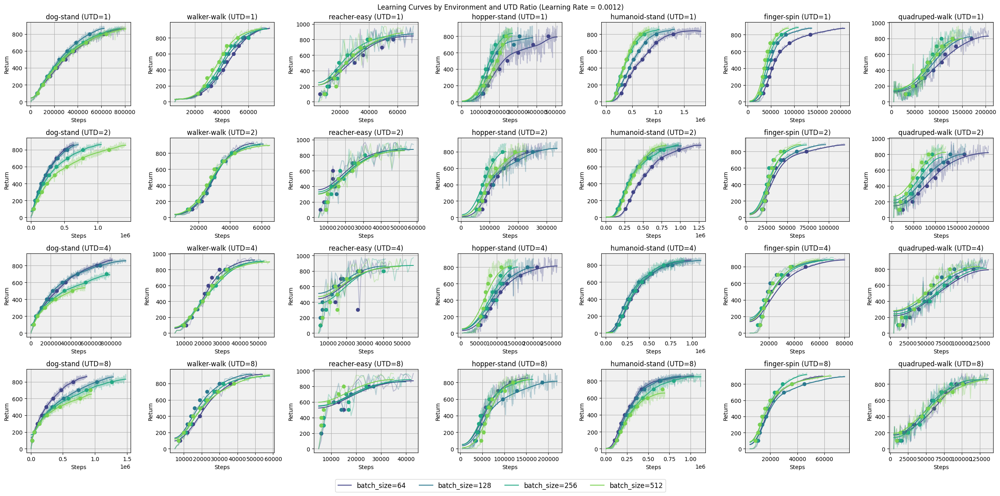

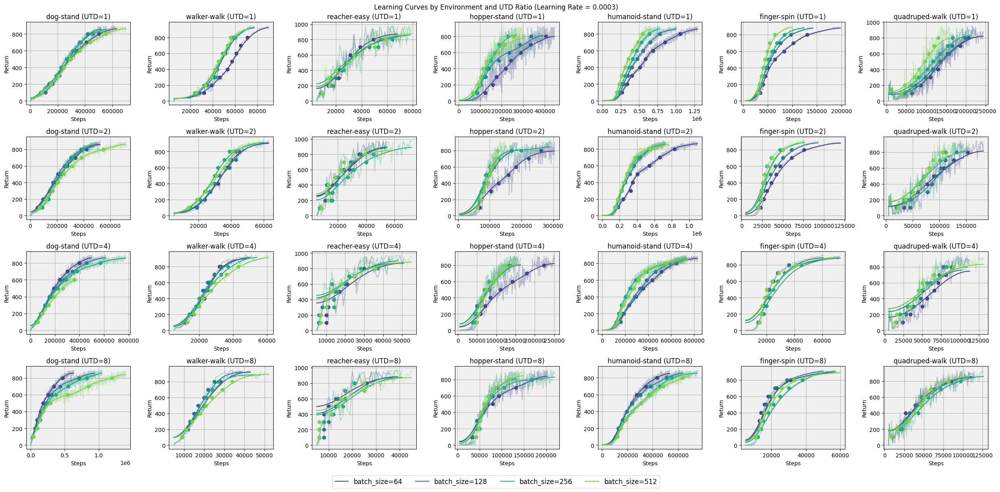

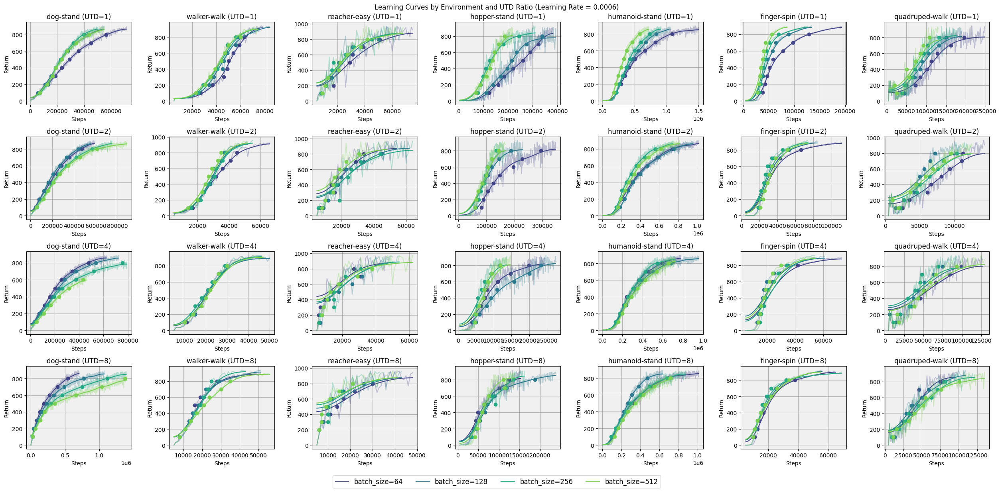

In [40]:
# plot curves

import matplotlib.pyplot as plt
import seaborn as sns

# Get unique learning rates
learning_rates = df['learning_rate'].unique()

# Create a separate plot for each learning rate
for lr in learning_rates:
    colors = sns.color_palette("viridis", n_colors=4)  # Using viridis for a nice gradient
    fig, axs = plt.subplots(4, 7, figsize=(25, 12))
    fig.suptitle(f'Learning Curves by Environment and UTD Ratio (Learning Rate = {lr})')

    lines = []
    labels = []
    config_colors = {}
    color_idx = 0

    # Filter data for current learning rate
    df_filtered = df[df['learning_rate'] == lr]

    # Group data by environment and UTD ratio
    for i, env in enumerate(df['env_name'].unique()):
        env_data = df_filtered[df_filtered['env_name'] == env]
        
        # Create separate plots for each UTD value
        for j, utd in enumerate(sorted(env_data['utd'].unique())):
            utd_data = env_data[env_data['utd'] == utd]
            # Sort by UTD
            utd_data = utd_data.sort_values('batch_size')
            
            ax = axs[j, i]
            ax.set_title(f'{env} (UTD={utd})')
            
            for _, row in utd_data.iterrows():
                config = row['batch_size']
                if config not in config_colors:
                    config_colors[config] = color_idx
                    color_idx += 1
                
                label = f"batch_size={row['batch_size']}"
                line = ax.plot(row['training_step'], row['mean_return'], alpha=0.3, color=colors[config_colors[config] % len(colors)])
                results = scipy.ndimage.gaussian_filter1d(row['mean_return'], smoothing[env, row['utd']])
                line = ax.plot(row['training_step'], results, alpha=1, color=colors[config_colors[config] % len(colors)])

                # Find intersections with 800
                # threshold = 800
                # crossings = np.mean(np.where(np.diff(np.signbit(np.array(row['mean_return']) - threshold))), axis=1).astype(int)
                # if crossings > 0:
                #     crossing_x = row['training_step'][crossings]
                #     crossing_y = [threshold] * len(crossings)
                #     ax.plot(crossing_x, crossing_y, 'o', color=colors[config_colors[config] % len(colors)])

                # use the crossings column to plot crossings
                for k, threshold in enumerate(thresholds):
                    crossing_x = row['crossings'][k]
                    crossing_y = threshold
                    ax.plot(crossing_x, crossing_y, 'o', color=colors[config_colors[config] % len(colors)])

                # Apply binning instead of smoothing
                # def bin_data(steps, values, bin_size=10000):
                #     bins = np.arange(0, max(steps), bin_size)
                #     binned_values = []
                #     binned_steps = []
                    
                #     for i in range(len(bins)-1):
                #         mask = (steps >= bins[i]) & (steps < bins[i+1])
                #         if np.any(mask):
                #             binned_values.append(np.mean(values[mask]))
                #             binned_steps.append(np.mean(steps[mask]))
                    
                #     return binned_steps, binned_values
                # bin_steps, bin_returns = bin_data(row['training_step'], row['mean_return'], 1.5e4)
                # line = ax.plot(bin_steps, bin_returns, alpha=1, color=colors[config_colors[config] % len(colors)])
                
                # Only add to legend if we haven't seen this combination before
                if label not in labels:
                    lines.append(line[0])
                    labels.append(label)
            
            ax.set_xlabel('Steps')
            ax.set_ylabel('Return')
            ax.grid(True)
            
            # Set background color
            ax.set_facecolor('#f0f0f0')

    # Sort labels by batch size
    sorted_indices = [i for i, _ in sorted(enumerate(labels), 
                                         key=lambda x: float(x[1].replace("batch_size=","")))]
    lines = [lines[i] for i in sorted_indices]
    labels = [labels[i] for i in sorted_indices] 

    # Create a single legend outside all subplots
    fig.legend(lines, labels, bbox_to_anchor=(0.5, 0), loc='upper center', ncol=(len(labels)), fontsize=12)
    plt.tight_layout()
    plt.show()

/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/matplotlib/axes/_axes.py:1148: RuntimeWarning: All-NaN axis encountered
  miny = np.nanmin(masked_verts[..., 1])
/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/matplotlib/axes/_axes.py:1149: RuntimeWarning: All-NaN axis encountered
  maxy = np.nanmax(masked_verts[..., 1])


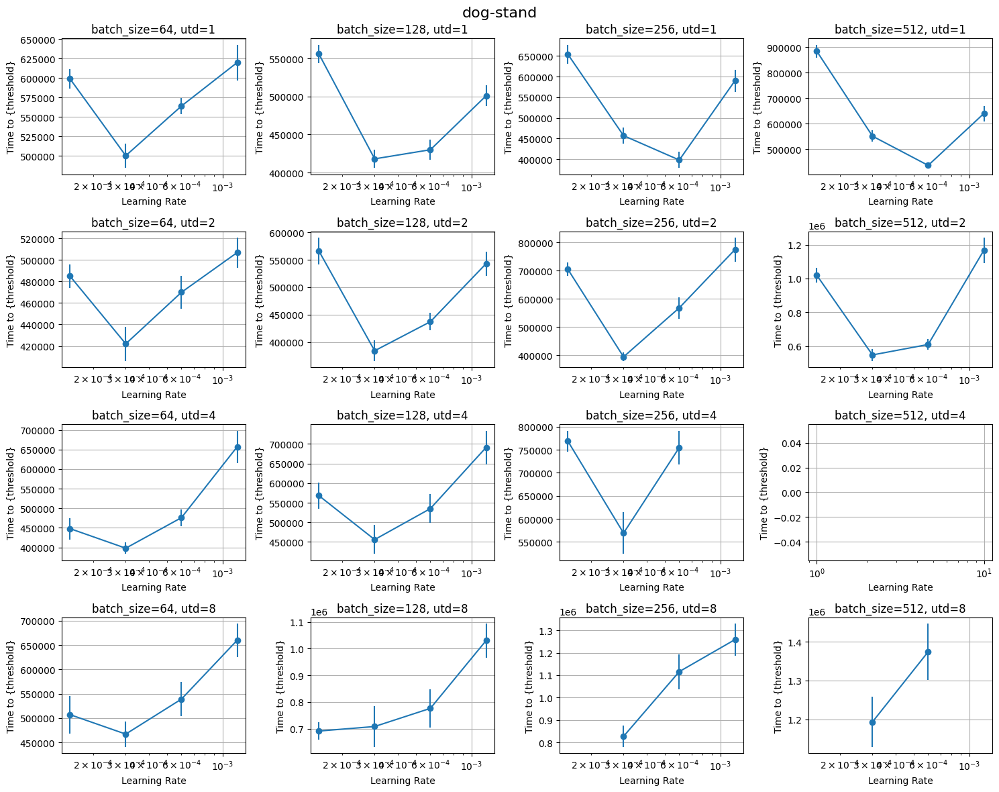

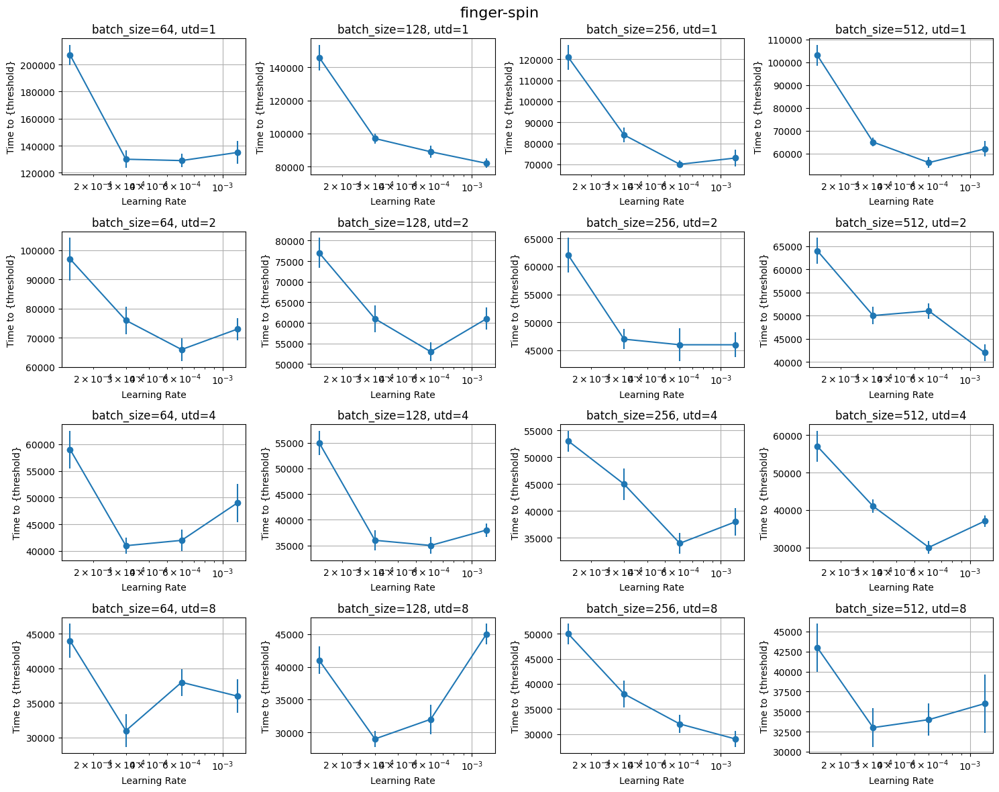

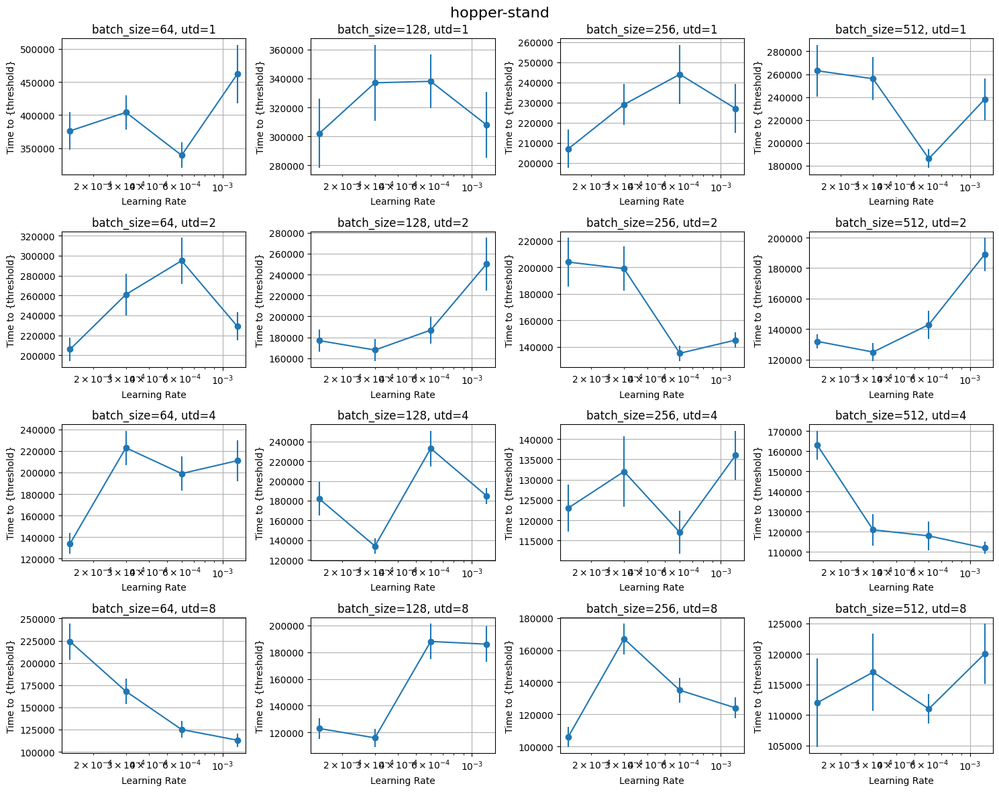

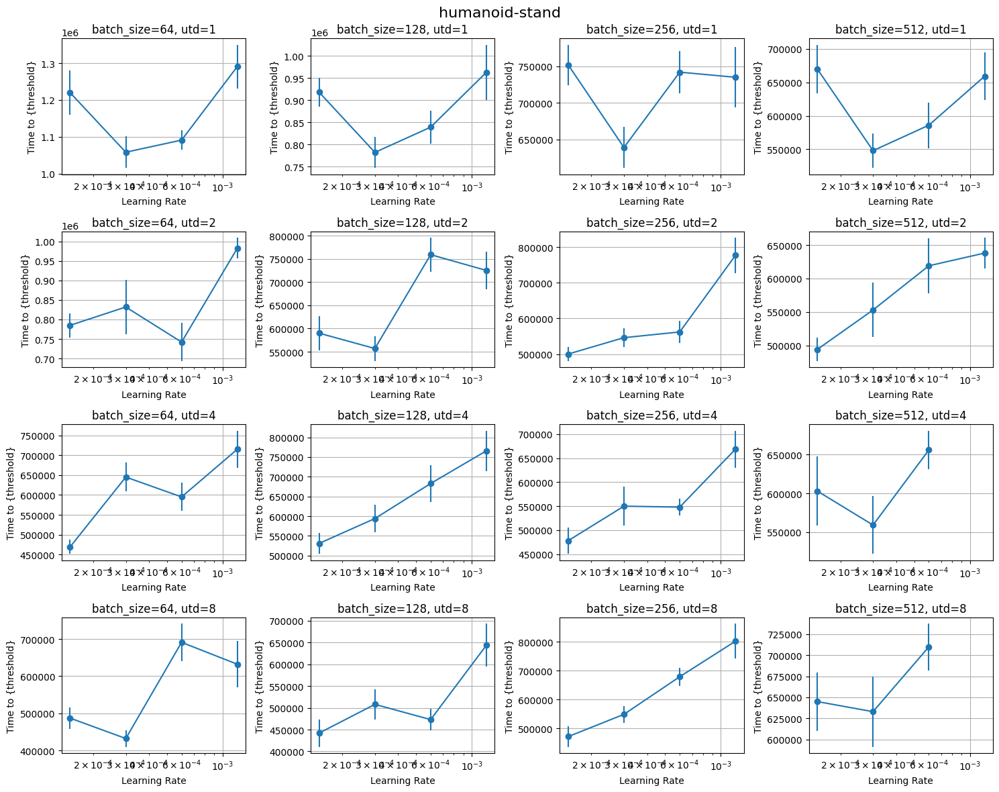

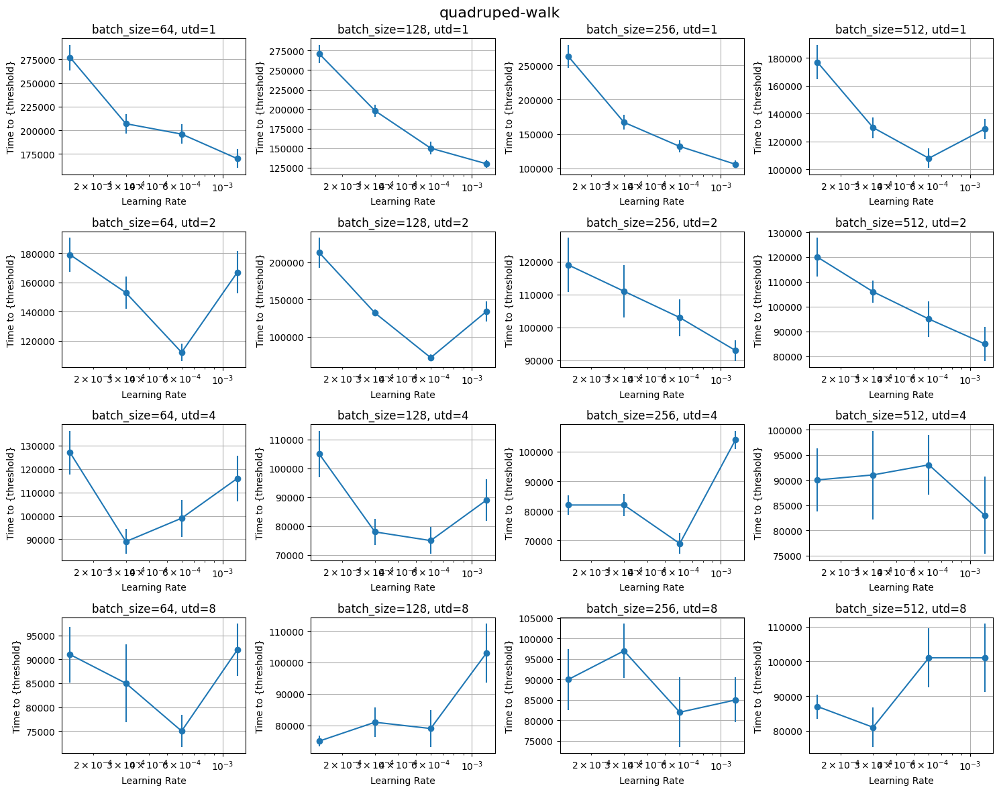

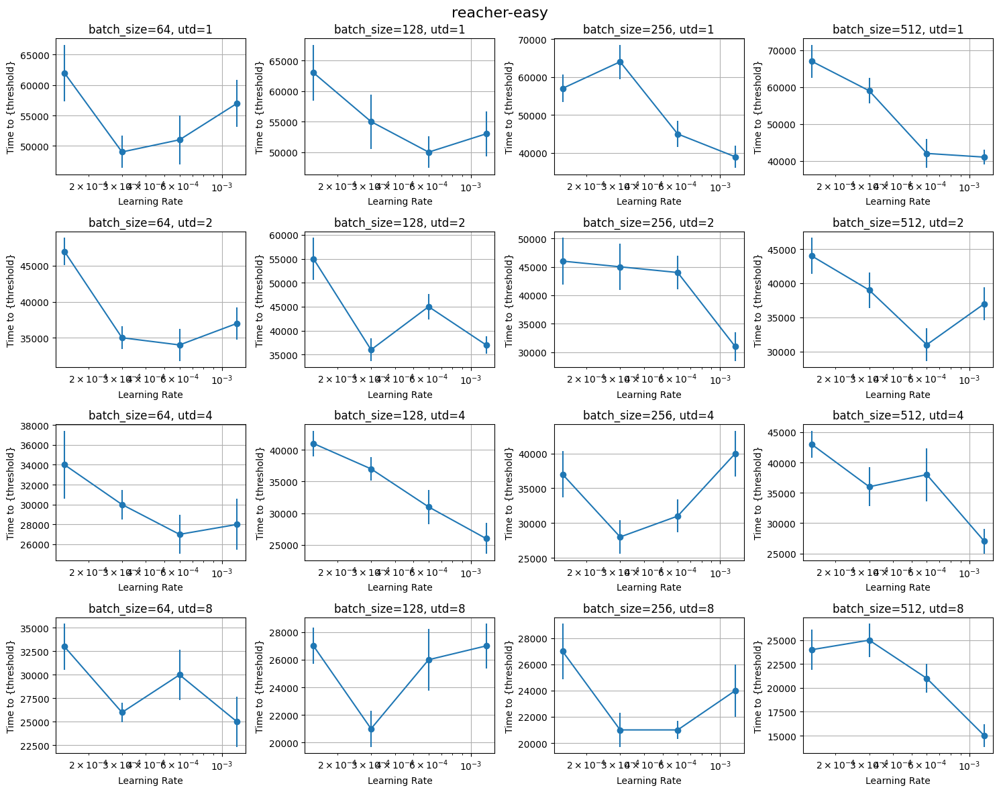

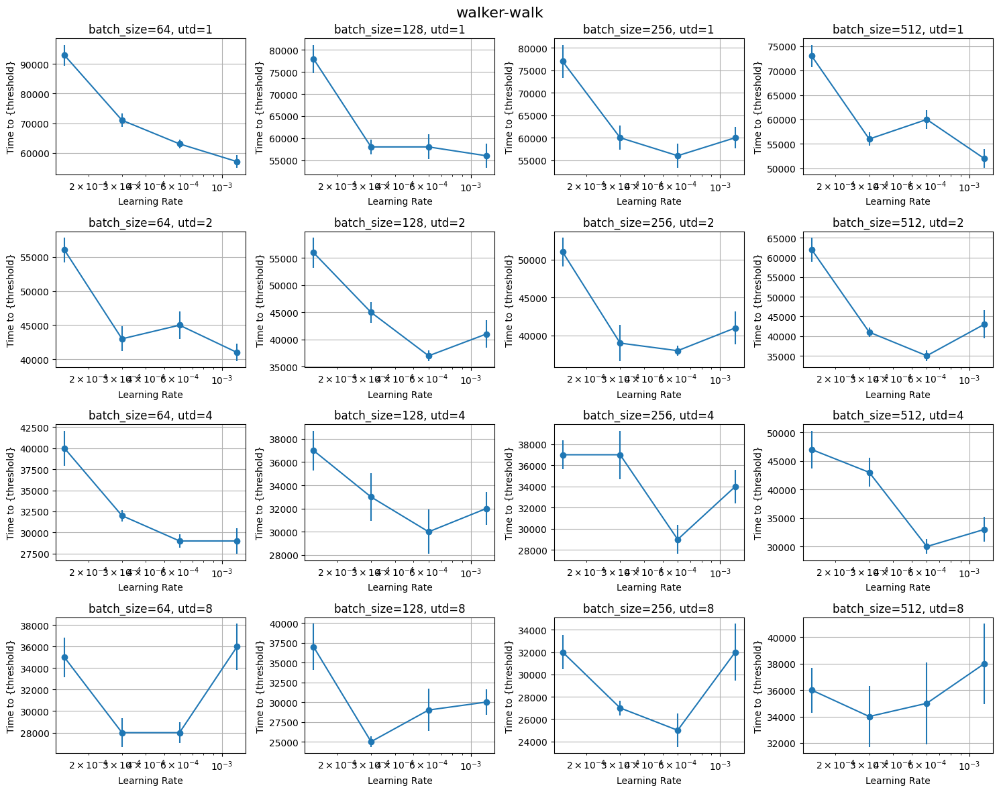

In [42]:
# Plot learning rate vs performance for each environment, batch size and UTD
unique_envs = sorted(df['env_name'].unique())
unique_batch_sizes = sorted(df['batch_size'].unique()) 
unique_utds = sorted(df['utd'].unique())

for env in unique_envs:
    # Create a new figure for each environment
    cols = 4
    rows = int(np.ceil(len(unique_batch_sizes) * len(unique_utds) / cols))
    fig, axs = plt.subplots(rows, cols, figsize=(15, 3*rows))
    axs = axs.flatten()
    
    plot_idx = 0
    env_data = df[df['env_name'] == env]
    
    for utd in unique_utds:
        for batch_size in unique_batch_sizes:
            data = env_data[(env_data['batch_size'] == batch_size) & 
                           (env_data['utd'] == utd)]
            
            if len(data) == 0:
                continue
                
            # Group by learning rate
            lr_groups = data.groupby('learning_rate')
            threshold_i = -1
            threshold = thresholds[threshold_i]

            time_to_threshold = lr_groups.apply(lambda x: np.mean([r[threshold_i] for r in x['crossings']]))
            sem = lr_groups.apply(lambda x: np.mean([r[threshold_i] for r in x['crossings_sem']]))
            
            lrs = sorted(lr_groups.groups.keys())
            means = [time_to_threshold[lr] for lr in lrs]
            sems = [sem[lr] for lr in lrs]
            
            axs[plot_idx].errorbar(lrs, means, yerr=sem, fmt='o-')
            
            axs[plot_idx].set_xscale('log')
            axs[plot_idx].set_xlabel('Learning Rate')
            axs[plot_idx].set_ylabel('Time to {threshold}')
            axs[plot_idx].set_title(f'batch_size={batch_size}, utd={utd}')
            axs[plot_idx].grid(True)
            
            plot_idx += 1
    
    # Remove empty subplots
    for i in range(plot_idx, len(axs)):
        fig.delaxes(axs[i])
        
    fig.suptitle(env, fontsize=16)
    plt.tight_layout()
    plt.show()


In [66]:
# make and print a table with best learning rate for each environment, batch size and UTD
# with environment as rows and utd x batch size as columns

# Group data by environment, batch size and UTD
grouped = df.groupby(['env_name', 'batch_size', 'utd'])

# Find best learning rate for each group
results = []
for (env, bs, utd), group in grouped:
    threshold_i = -1
    
    # Calculate mean time to threshold for each learning rate
    lr_groups = group.groupby('learning_rate')
    time_to_threshold = lr_groups.apply(lambda x: np.mean([r[threshold_i] for r in x['crossings']]))
    
    # Find learning rate with minimum time, ignoring NaN values
    time_to_threshold = time_to_threshold.dropna()
    if len(time_to_threshold) > 0:
        best_lr = time_to_threshold.idxmin()
        min_time = time_to_threshold[best_lr]
    else:
        best_lr = None
        min_time = None

    # # calculate the uncertainty-corrected best learning rate using existing function
    # lr_groups_sem = {lr: np.mean([r[threshold_i] for r in group['crossings_sem']]) for lr, group in lr_groups}
    # lrs_unique = sorted(lr_groups.groups.keys())
    # time_to_threshold_dict = {lr: np.mean([r[threshold_i] for r in group['crossings']]) for lr, group in lr_groups}
    # probs = calculate_lr_probabilities(time_to_threshold_dict, lr_groups_sem, lrs_unique)
    # best_lr_uncertainty = sum(lr * prob for lr, prob in zip(lrs_unique, probs))    
    
    results.append({
        'env_name': env,
        'batch_size': bs,
        'utd': utd,
        'best_lr': best_lr,
        # 'best_lr_uncertainty': best_lr_uncertainty,
        'time_to_threshold': min_time,
        'crossings': group[group['learning_rate'] == best_lr]['crossings'].tolist() if best_lr is not None else [],
        'crossings_sem': group[group['learning_rate'] == best_lr]['crossings_sem'].tolist() if best_lr is not None else [],
        'return': group[group['learning_rate'] == best_lr]['return'].tolist() if best_lr is not None else [],
        'mean_return': group[group['learning_rate'] == best_lr]['mean_return'].tolist() if best_lr is not None else [],
        'std_return': group[group['learning_rate'] == best_lr]['std_return'].tolist() if best_lr is not None else []
    })

# Create DataFrame
df_best_lr = pd.DataFrame(results)

# Pivot table to get environments as rows and utd x batch_size as columns
pivot_df = df_best_lr.pivot_table(
    index='env_name',
    columns=['utd', 'batch_size'],
    values='best_lr',
    aggfunc='first'
)

# Print formatted table with scientific notation
pd.set_option('display.float_format', '{:.1e}'.format)
print("\nBest Learning Rates:")
print(pivot_df.to_string())

# # print the uncertainty-corrected best learning rates
# pivot_df_uncertainty = df_best_lr.pivot_table(
#     index='env_name',
#     columns=['utd', 'batch_size'],
#     values='best_lr_uncertainty',
#     aggfunc='first'
# )
# pd.set_option('display.float_format', '{:.1e}'.format)
# print("\nUncertainty-Corrected Best Learning Rates:")
# print(pivot_df_uncertainty.to_string())

# Also show time to threshold
time_pivot = df_best_lr.pivot_table(
    index='env_name', 
    columns=['utd', 'batch_size'],
    values='time_to_threshold',
    aggfunc='first'
)

print("\nTime to Threshold:")
print(time_pivot.to_string())

# give correlation between batch size and learning rate
print()
print('correlation between batch size and learning rate',  np.corrcoef(df_best_lr['batch_size'], df_best_lr['best_lr'])[0, 1])
print('correlation between batch size and learning rate for utd=1', np.corrcoef(df_best_lr[df_best_lr['utd'] == 1]['batch_size'], df_best_lr[df_best_lr['utd'] == 1]['best_lr'])[0, 1])
print('correlation between batch size and learning rate for utd=2', np.corrcoef(df_best_lr[df_best_lr['utd'] == 2]['batch_size'], df_best_lr[df_best_lr['utd'] == 2]['best_lr'])[0, 1])
print('correlation between batch size and learning rate for utd=4', np.corrcoef(df_best_lr[df_best_lr['utd'] == 4]['batch_size'], df_best_lr[df_best_lr['utd'] == 4]['best_lr'])[0, 1])
print('correlation between batch size and learning rate for utd=8', np.corrcoef(df_best_lr[df_best_lr['utd'] == 8]['batch_size'], df_best_lr[df_best_lr['utd'] == 8]['best_lr'])[0, 1])



Best Learning Rates:
utd                  1                               2                               4                               8                        
batch_size         64      128     256     512     64      128     256     512     64      128     256     512     64      128     256     512
env_name                                                                                                                                      
dog-stand      3.0e-04 3.0e-04 6.0e-04 6.0e-04 3.0e-04 3.0e-04 3.0e-04 3.0e-04 3.0e-04 3.0e-04 3.0e-04     NaN 3.0e-04 1.5e-04 3.0e-04 3.0e-04
finger-spin    6.0e-04 1.2e-03 6.0e-04 6.0e-04 6.0e-04 6.0e-04 6.0e-04 1.2e-03 3.0e-04 6.0e-04 6.0e-04 6.0e-04 3.0e-04 3.0e-04 1.2e-03 3.0e-04
hopper-stand   6.0e-04 1.5e-04 1.5e-04 6.0e-04 1.5e-04 3.0e-04 6.0e-04 3.0e-04 1.5e-04 3.0e-04 6.0e-04 1.2e-03 1.2e-03 3.0e-04 1.5e-04 6.0e-04
humanoid-stand 3.0e-04 3.0e-04 3.0e-04 3.0e-04 6.0e-04 3.0e-04 1.5e-04 1.5e-04 1.5e-04 1.5e-04 1.5e-04 3.0e-04 3.0e-04 1

In [46]:
def calculate_lr_probabilities(lr_groups, lr_groups_sem, lrs_unique):
    """Calculate probability of each learning rate being the best and estimate optimal learning rate.
    
    Args:
        lr_groups: Dictionary mapping learning rates to lists of performance values
        lrs_unique: Array of unique learning rate values
        
    Returns:
        best_prob: Array of probabilities that each learning rate is the best
        approx_best_lr: Estimated optimal learning rate
    """
    # Calculate probability of each learning rate being the best 
    from scipy.stats import norm
    
    # Remove any groups with NaN values
    lr_groups = {k: v for k, v in lr_groups.items() if not np.isnan(v).any()}
    lr_groups_sem = {k: v for k, v in lr_groups_sem.items() if not np.isnan(v).any()}
    lrs_unique = [lr for lr in lrs_unique if lr in lr_groups]
    
    if len(lr_groups) == 0:
        return np.array([]), np.nan
            
    distributions = [norm(np.mean(vals), sem) for vals, sem in zip(lr_groups.values(), lr_groups_sem.values())]

    # Calculate probability that each learning rate is better than all others
    probabilities = np.ones((len(distributions), len(distributions)))

    for i in range(len(distributions)):
        for j in range(len(distributions)):
            if i != j:            
                # Calculate p(x>y) using formula: p(x>y) = cdf((mx - my) / sqrt(varx + vary))
                z = (distributions[j].mean() - distributions[i].mean()) / np.sqrt(distributions[i].std()**2 + distributions[j].std()**2)
                probabilities[i,j] = norm.cdf(z)

    # Print probability matrix
    print("\nProbability matrix (p(row>column)):")
    print("LRs:", [f"{lr:.1e}" for lr in lrs_unique])
    
    # Calculate probabilities each learning rate is the best
    best_prob = np.prod(probabilities, axis=1) / np.prod(probabilities, axis=1).sum()
    approx_best_lr = (np.array(lrs_unique) * best_prob).sum()
    
    print('probabilities of being the best:', best_prob)
    print('approximate best learning rate:', f'{approx_best_lr:.2e}')
    
    return best_prob, approx_best_lr, _

def calculate_lr_probabilities(lr_groups, lr_groups_sem, lrs_unique, n_samples=1000):
    """
    Calculate probability distribution over learning rates using Monte Carlo sampling.
    
    Args:
        lr_groups: Dictionary mapping learning rates to mean times
        lr_groups_sem: Dictionary mapping learning rates to standard errors
        lrs_unique: Array of unique learning rates
        n_samples: Number of Monte Carlo samples
        
    Returns:
        lr_probs: Probability distribution over learning rates
        mc_mean: Mean of Monte Carlo samples
    """
    best_lr_samples = []

    for _ in range(n_samples):
        # Sample from normal distribution for each group using means and SEMs
        sampled_times = []
        for group_mean, group_sem in zip(lr_groups.values(), lr_groups_sem.values()):
            # Sample from normal distribution
            sample = np.random.normal(group_mean, group_sem)
            sampled_times.append(sample)
        
        # Find best learning rate for this sample
        best_idx = np.argmin(sampled_times)
        best_lr_samples.append(lrs_unique[best_idx])

    # Calculate probability distribution over learning rates
    lr_counts = np.bincount(np.searchsorted(lrs_unique, best_lr_samples), minlength=len(lrs_unique))
    lr_probs = lr_counts / n_samples

    # Calculate mean and standard error of the Monte Carlo samples
    mc_mean = np.mean(best_lr_samples)
    mc_sem = np.sqrt(np.sum(lr_probs * (lrs_unique - mc_mean)**2))
    
    return lr_probs, mc_mean, mc_sem



# Get uncertainty-corrected best learning rate for each batch size
grouped = df.groupby(['env_name', 'batch_size', 'utd'])

# Find uncertainty-corrected best learning rate for each group
results = []
for (env, bs, utd), group in grouped:
    threshold_i = -1
    
    # Get performance data for each learning rate
    lr_groups = {}
    lr_groups_sem = {}
    lrs_unique = sorted(group['learning_rate'].unique())
    
    for lr in lrs_unique:
        lr_data = group[group['learning_rate'] == lr]
        times = [r[threshold_i] for r in lr_data['crossings']]
        sems = [r[threshold_i] for r in lr_data['crossings_sem']]
        lr_groups[lr] = times
        lr_groups_sem[lr] = sems
        
    # Calculate uncertainty-corrected best learning rate
    best_prob, best_lr, best_sem = calculate_lr_probabilities(lr_groups, lr_groups_sem, lrs_unique)
    
    # Get mean time to threshold for best learning rate
    best_times = lr_groups[lrs_unique[np.argmax(best_prob)]]
    min_time = np.mean(best_times)
    
    results.append({
        'env_name': env,
        'batch_size': bs,
        'utd': utd,
        'best_lr_uncertainty': best_lr,
        'best_lr_sem': best_sem,
        'time_to_threshold': min_time
    })

# Create DataFrame
df_best_lr_uncertainty = pd.DataFrame(results)

# Pivot table to get environments as rows and utd x batch_size as columns  
pivot_df_uncertainty = df_best_lr_uncertainty.pivot_table(
    index='env_name',
    columns=['utd', 'batch_size'],
    values='best_lr_uncertainty',
    aggfunc='first'
)

# Print formatted table with scientific notation
pd.set_option('display.float_format', '{:.1e}'.format)
print("\nBest Learning Rates:")
print(pivot_df_uncertainty.to_string())

# also print the old best learning rates
# Create pivot table for original results
pivot_df = df_best_lr.pivot_table(
    index='env_name',
    columns=['utd', 'batch_size'],
    values='best_lr',
    aggfunc='first'
)

print("\nOriginal Best Learning Rates (without uncertainty correction):")
print(pivot_df.to_string())



Best Learning Rates:
utd                  1                               2                               4                               8                        
batch_size         64      128     256     512     64      128     256     512     64      128     256     512     64      128     256     512
env_name                                                                                                                                      
dog-stand      3.0e-04 3.8e-04 5.9e-04 6.0e-04 3.0e-04 3.1e-04 3.0e-04 3.3e-04 2.9e-04 3.2e-04 1.2e-03 1.5e-04 2.8e-04 2.5e-04 1.5e-04 1.5e-04
finger-spin    6.1e-04 1.2e-03 7.5e-04 6.4e-04 6.4e-04 6.0e-04 7.9e-04 1.2e-03 4.2e-04 5.2e-04 6.6e-04 6.0e-04 3.6e-04 3.3e-04 1.1e-03 5.3e-04
hopper-stand   5.3e-04 5.9e-04 2.4e-04 6.0e-04 2.7e-04 2.9e-04 6.6e-04 2.9e-04 1.5e-04 3.0e-04 5.0e-04 9.7e-04 1.1e-03 2.6e-04 1.8e-04 4.1e-04
humanoid-stand 3.7e-04 3.4e-04 3.2e-04 3.6e-04 5.0e-04 2.6e-04 1.8e-04 1.6e-04 1.5e-04 1.6e-04 1.6e-04 1.2e-03 2.9e-04 2

best learning rate: 2.6e-04 ± 1.5e-04 = [1.2e-04, 4.1e-04]
[0.00015, 0.0003, 0.0006] [0.507 0.365 0.128]


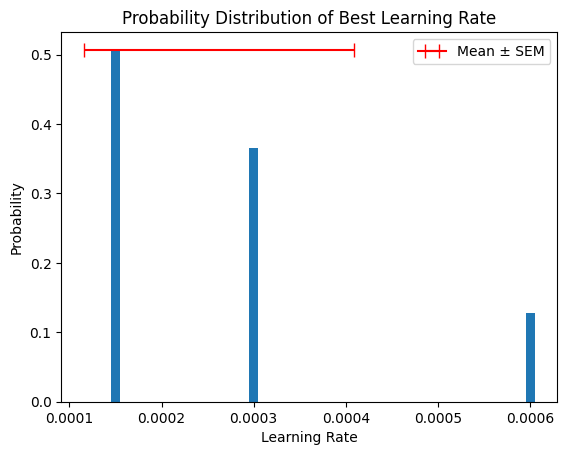

In [51]:
# get lr for finger-spin, utd 1, batch size 64
# Get data for finger-spin with UTD=1 and batch_size=64
group = df[
    (df['env_name'] == 'dog-stand') & 
    (df['utd'] == 8) & 
    (df['batch_size'] == 128)
]

lr_groups = {}
lr_groups_sem = {}
lrs_unique = sorted(group['learning_rate'].unique())
n_samples = 1000
threshold_i = -1

for lr in lrs_unique:
    lr_data = group[group['learning_rate'] == lr]
    times = [r[threshold_i] for r in lr_data['crossings']]
    sems = [r[threshold_i] for r in lr_data['crossings_sem']]
    lr_groups[lr] = times
    lr_groups_sem[lr] = sems


best_lr_samples = []

for _ in range(n_samples):
    # Sample from normal distribution for each group using means and SEMs
    sampled_times = []
    for group_mean, group_sem in zip(lr_groups.values(), lr_groups_sem.values()):
        # Sample from normal distribution
        sample = np.random.normal(group_mean, group_sem)
        sampled_times.append(sample)
    
    # Find best learning rate for this sample
    best_idx = np.argmin(sampled_times)
    best_lr_samples.append(lrs_unique[best_idx])

# Calculate probability distribution over learning rates
lr_counts = np.bincount(np.searchsorted(lrs_unique, best_lr_samples), minlength=len(lrs_unique))
lr_probs = lr_counts / n_samples

# Calculate mean and standard error of the Monte Carlo samples
mc_mean = np.mean(best_lr_samples)
mc_sem = np.sqrt(np.sum(lr_probs * (lrs_unique - mc_mean)**2))

print(f'best learning rate: {mc_mean:.1e} ± {mc_sem:.1e} = [{mc_mean - mc_sem:.1e}, {mc_mean + mc_sem:.1e}]')
print(lrs_unique, lr_probs)

# plot the probability distribution
plt.bar(lrs_unique, lr_probs, width=1e-5)
# Plot error bars for standard error
plt.errorbar(mc_mean, np.max(lr_probs), xerr=mc_sem, color='red', capsize=5, label='Mean ± SEM')
plt.legend()

# plt.xscale('log')
plt.ylabel('Probability')
plt.xlabel('Learning Rate')
plt.title('Probability Distribution of Best Learning Rate')
plt.show()


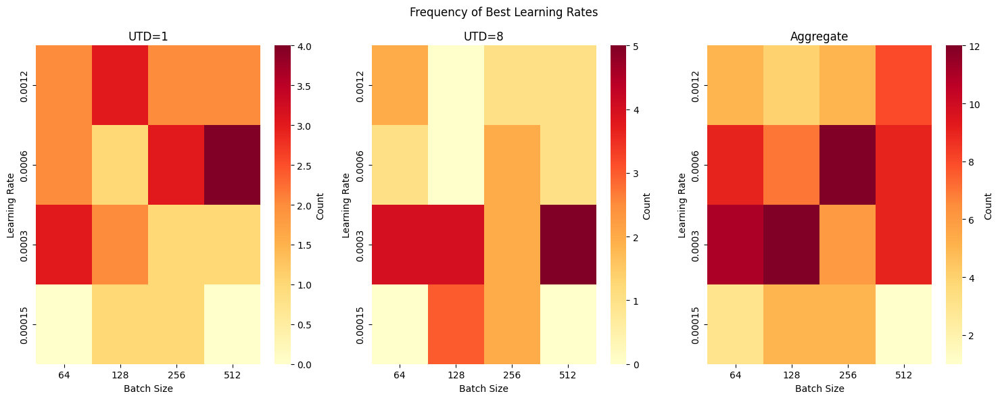

In [47]:
# plot a heatmap of learning rate vs batch size. that is, for each learning rate and batch size, plot the number of times it was the best learning rate

# Create pivot table for heatmap
heatmap_data = df_best_lr.pivot_table(
    index='best_lr',
    columns='batch_size',
    values='env_name',
    aggfunc='count',
    fill_value=0
)

# Create figure with three subplots - one for each UTD value plus aggregate
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 6))
fig.suptitle('Frequency of Best Learning Rates')

# Plot heatmap for UTD=1
utd1_data = df_best_lr[df_best_lr['utd'] == 1].pivot_table(
    index='best_lr',
    columns='batch_size',
    values='env_name', 
    aggfunc='count',
    fill_value=0
)
sns.heatmap(utd1_data, ax=ax1, cmap='YlOrRd', cbar_kws={'label': 'Count'})
ax1.invert_yaxis()  # Flip y-axis
ax1.set_title('UTD=1')
ax1.set_ylabel('Learning Rate')
ax1.set_xlabel('Batch Size')

# Plot heatmap for UTD=8  
utd8_data = df_best_lr[df_best_lr['utd'] == 8].pivot_table(
    index='best_lr',
    columns='batch_size',
    values='env_name',
    aggfunc='count', 
    fill_value=0
)
sns.heatmap(utd8_data, ax=ax2, cmap='YlOrRd', cbar_kws={'label': 'Count'})
ax2.invert_yaxis()  # Flip y-axis
ax2.set_title('UTD=8')
ax2.set_ylabel('Learning Rate')
ax2.set_xlabel('Batch Size')

# Plot aggregate heatmap across all UTD values
aggregate_data = df_best_lr.pivot_table(
    index='best_lr',
    columns='batch_size',
    values='env_name',
    aggfunc='count',
    fill_value=0
)
sns.heatmap(aggregate_data, ax=ax3, cmap='YlOrRd', cbar_kws={'label': 'Count'})
ax3.invert_yaxis()  # Flip y-axis
ax3.set_title('Aggregate')
ax3.set_ylabel('Learning Rate')
ax3.set_xlabel('Batch Size')

plt.tight_layout()
plt.show()


In [63]:
# now visualize the correlation between batch size and learning rate
# Calculate correlation between batch size and best learning rate
correlation = df_best_lr['best_lr'].corr(df_best_lr['batch_size'])
print(f"Overall correlation between best learning rate and batch size: {correlation}")

# Create scatter plot
plt.figure(figsize=(15, 6))

# Plot for UTD=1
plt.subplot(131)
utd1_data = df_best_lr[df_best_lr['utd'] == 1]
plt.scatter(utd1_data['batch_size'], utd1_data['best_lr'])
# Add correlation line
z1 = np.polyfit(np.log10(utd1_data['batch_size']), np.log10(utd1_data['best_lr']), 1)
p1 = np.poly1d(z1)
x1 = np.logspace(np.log10(utd1_data['batch_size'].min()), np.log10(utd1_data['batch_size'].max()), 100)
plt.plot(x1, 10**p1(np.log10(x1)), 'r--', label=f'learning_rate = batch size^{z1[0]:.2f} * {10**z1[1]:.2e}')
plt.xscale('log')
plt.yscale('log')
plt.ylabel('Best Learning Rate')
plt.xlabel('Batch Size')
plt.title('UTD=1')
plt.grid(True)
plt.legend()

# Plot for UTD=8
plt.subplot(132)
utd8_data = df_best_lr[df_best_lr['utd'] == 8]
plt.scatter(utd8_data['batch_size'], utd8_data['best_lr'])
# Add correlation line
z8 = np.polyfit(np.log10(utd8_data['batch_size']), np.log10(utd8_data['best_lr']), 1)
p8 = np.poly1d(z8)
x8 = np.logspace(np.log10(utd8_data['batch_size'].min()), np.log10(utd8_data['batch_size'].max()), 100)
plt.plot(x8, 10**p8(np.log10(x8)), 'r--', label=f'learning_rate = batch size^{z8[0]:.2f} * {10**z8[1]:.2e}')
plt.xscale('log')
plt.yscale('log')
plt.ylabel('Best Learning Rate')
plt.xlabel('Batch Size')
plt.title('UTD=8')
plt.grid(True)
plt.legend()

# Plot aggregate
plt.subplot(133)
plt.scatter(df_best_lr['batch_size'], df_best_lr['best_lr'])
# Add correlation line
z = np.polyfit(np.log10(df_best_lr['batch_size']), np.log10(df_best_lr['best_lr']), 1)
p = np.poly1d(z)
x = np.logspace(np.log10(df_best_lr['batch_size'].min()), np.log10(df_best_lr['batch_size'].max()), 100)
plt.plot(x, 10**p(np.log10(x)), 'r--', label=f'learning_rate = batch size^{z[0]:.2f} * {10**z[1]:.2e}')
plt.xscale('log')
plt.yscale('log')
plt.ylabel('Best Learning Rate')
plt.xlabel('Batch Size')
plt.title('Aggregate')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


NameError: name 'df_best_lr' is not defined

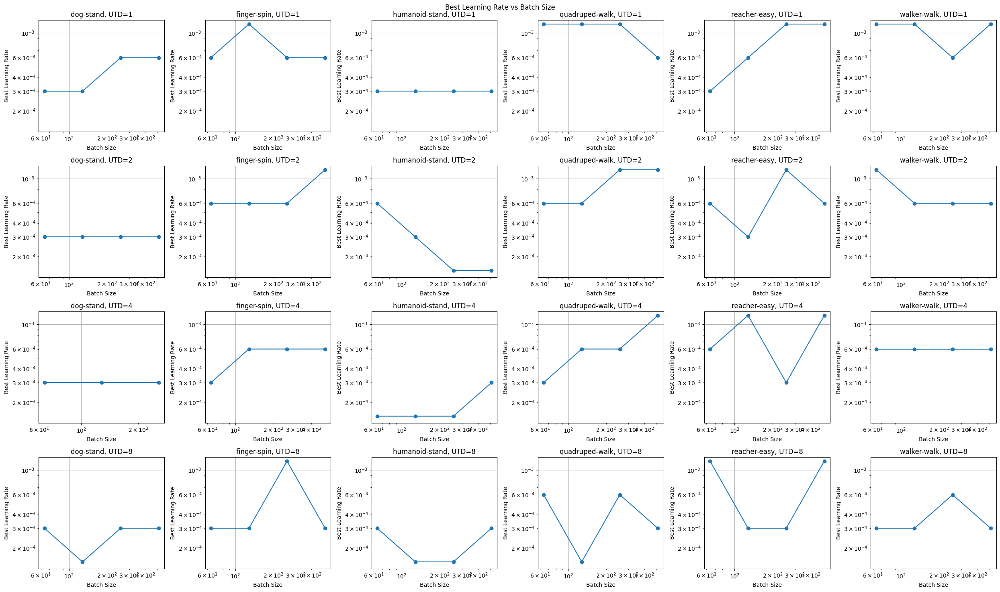

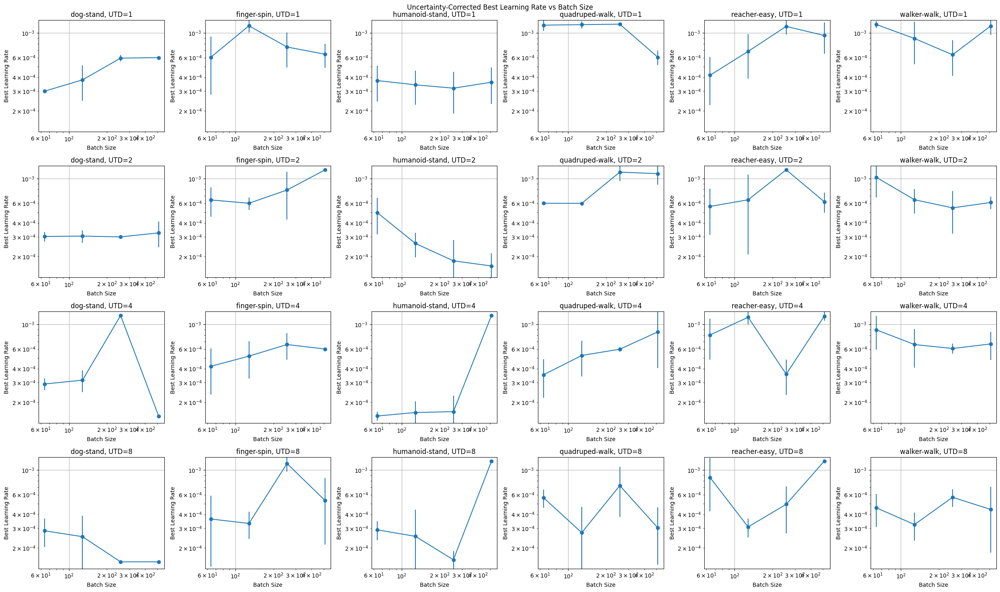

In [53]:
# for each utd and env, plot best learning rate depending on batch size
# Plot best learning rate vs batch size for each UTD and environment
unique_envs = sorted([env for env in df['env_name'].unique() if env != 'hopper-stand'])
unique_utds = sorted(df['utd'].unique())

fig, axs = plt.subplots(len(unique_utds), len(unique_envs), figsize=(25, 15))
fig.suptitle('Best Learning Rate vs Batch Size')

for i, env in enumerate(unique_envs):
    for j, utd in enumerate(unique_utds):
        env_data = df_best_lr[
            (df_best_lr['env_name'] == env) & 
            (df_best_lr['utd'] == utd)
        ]
        
        if len(env_data) > 0:
            batch_sizes = env_data['batch_size']
            best_lrs = env_data['best_lr']
            
            axs[j, i].plot(batch_sizes, best_lrs, 'o-')
            axs[j, i].set_xscale('log')
            axs[j, i].set_yscale('log')
            axs[j, i].set_ylim(1.3e-4, 1.3e-3)
            axs[j, i].set_xlabel('Batch Size')
            axs[j, i].set_ylabel('Best Learning Rate')
            axs[j, i].set_title(f'{env}, UTD={utd}')
            axs[j, i].grid(True)

plt.tight_layout()
plt.show()

# print this but for uncertainty-corrected best learning rates
# Plot best learning rate vs batch size for each UTD and environment using uncertainty-corrected values
unique_envs = sorted([env for env in df['env_name'].unique() if env != 'hopper-stand'])
unique_utds = sorted(df['utd'].unique())

fig, axs = plt.subplots(len(unique_utds), len(unique_envs), figsize=(25, 15))
fig.suptitle('Uncertainty-Corrected Best Learning Rate vs Batch Size')

for i, env in enumerate(unique_envs):
    for j, utd in enumerate(unique_utds):
        env_data = df_best_lr_uncertainty[
            (df_best_lr_uncertainty['env_name'] == env) & 
            (df_best_lr_uncertainty['utd'] == utd)
        ]
        
        if len(env_data) > 0:
            batch_sizes = env_data['batch_size']
            best_lrs = env_data['best_lr_uncertainty'] 
            best_lrs_err = env_data['best_lr_sem']
            axs[j, i].errorbar(batch_sizes, best_lrs, yerr=best_lrs_err, fmt='o-')
            axs[j, i].set_xscale('log')
            axs[j, i].set_yscale('log')
            axs[j, i].set_ylim(1.3e-4, 1.3e-3)
            axs[j, i].set_xlabel('Batch Size')
            axs[j, i].set_ylabel('Best Learning Rate')
            axs[j, i].set_title(f'{env}, UTD={utd}')
            axs[j, i].grid(True)

plt.tight_layout()  
plt.show()


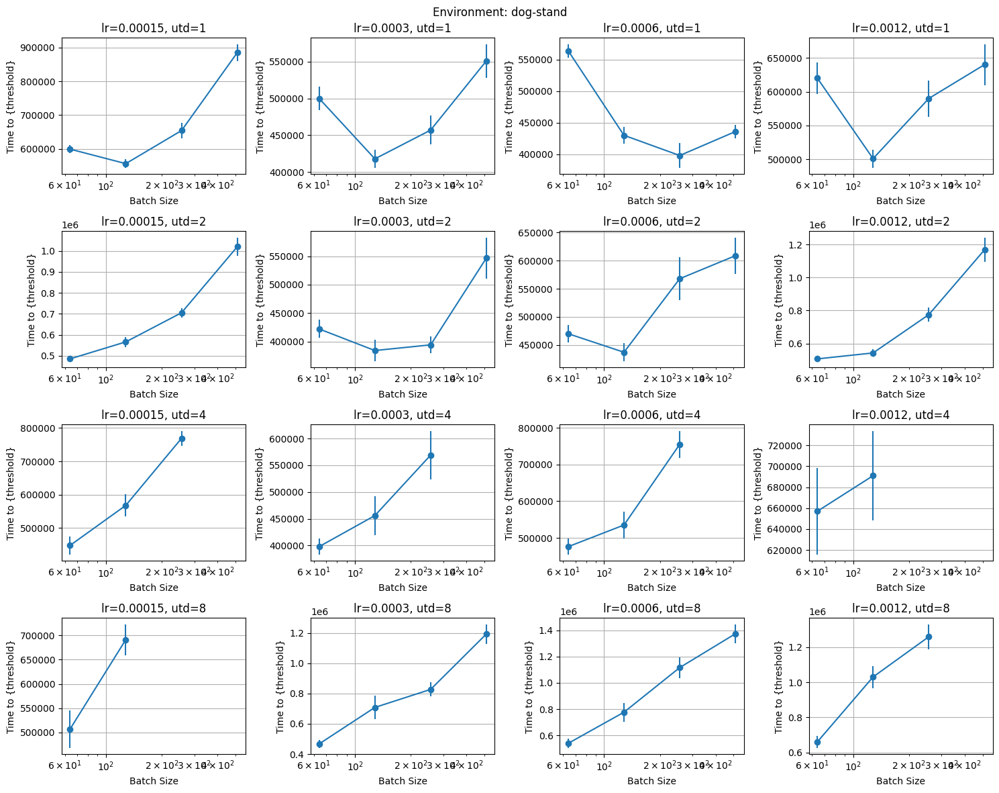

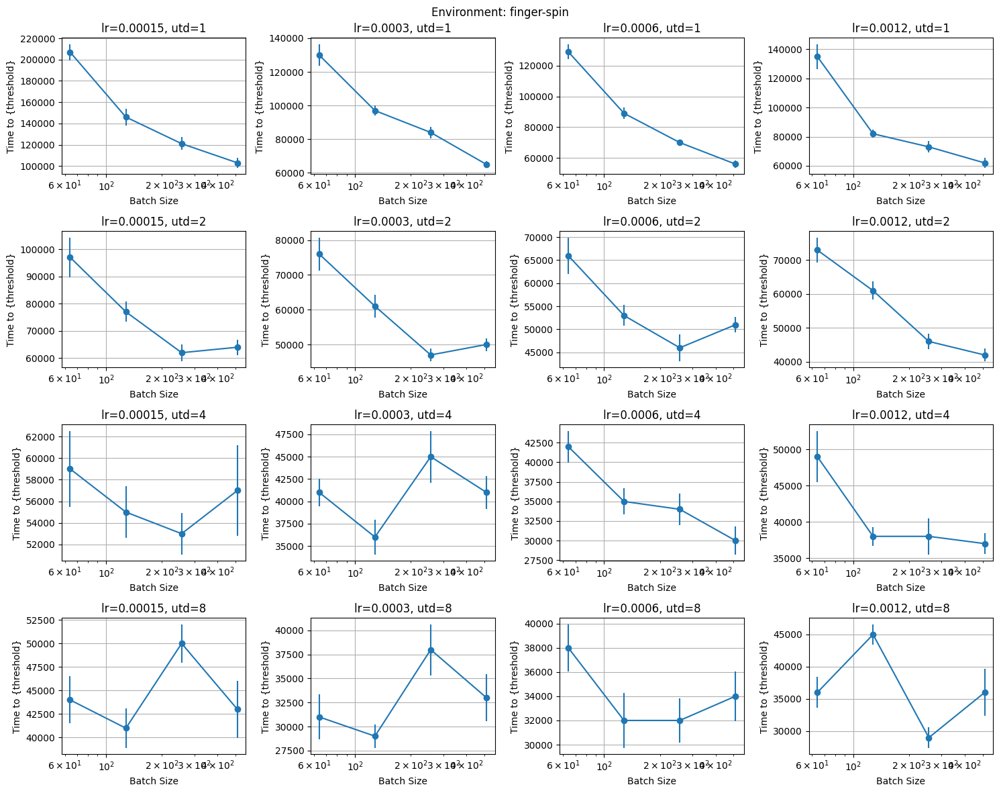

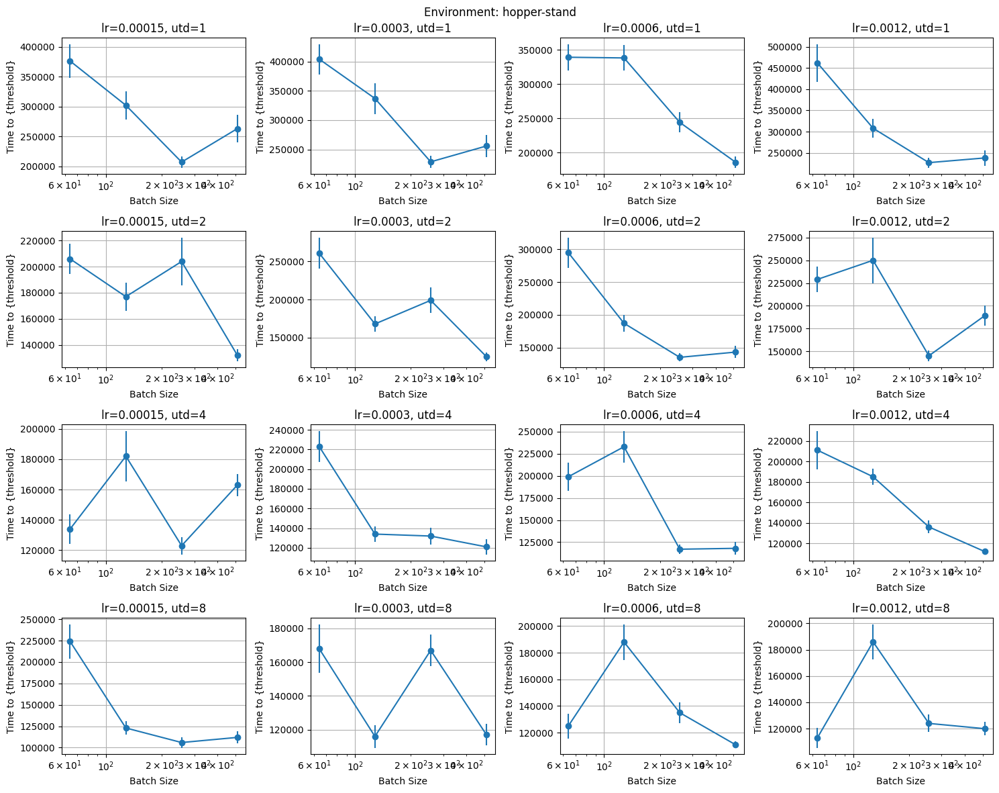

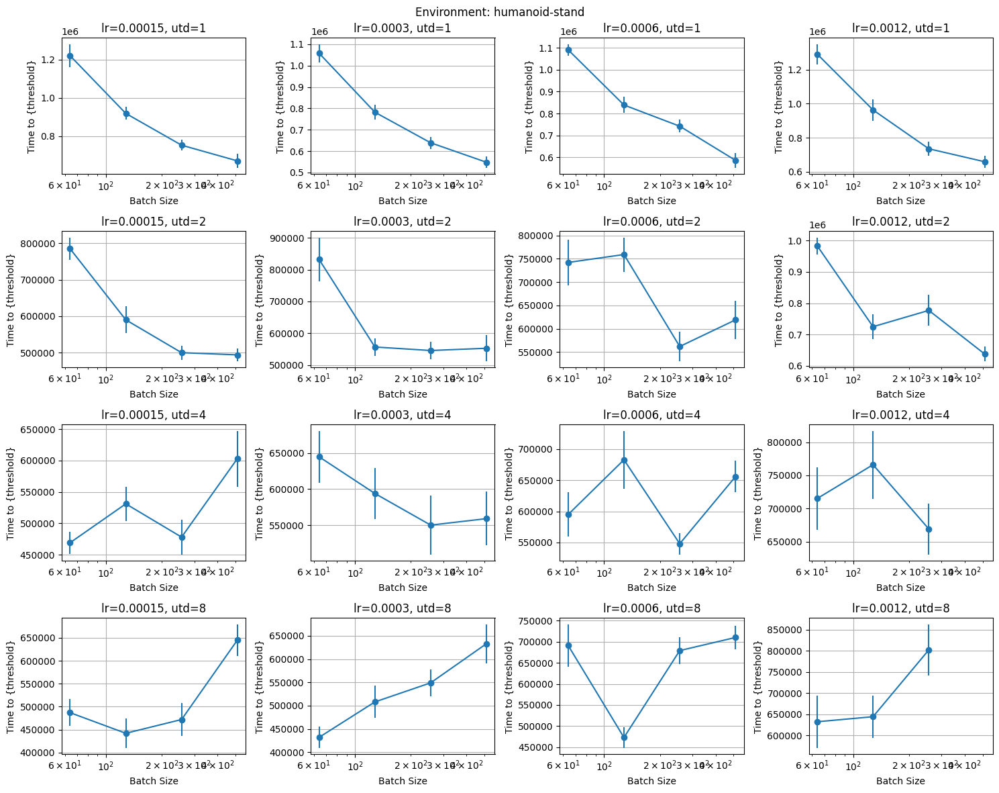

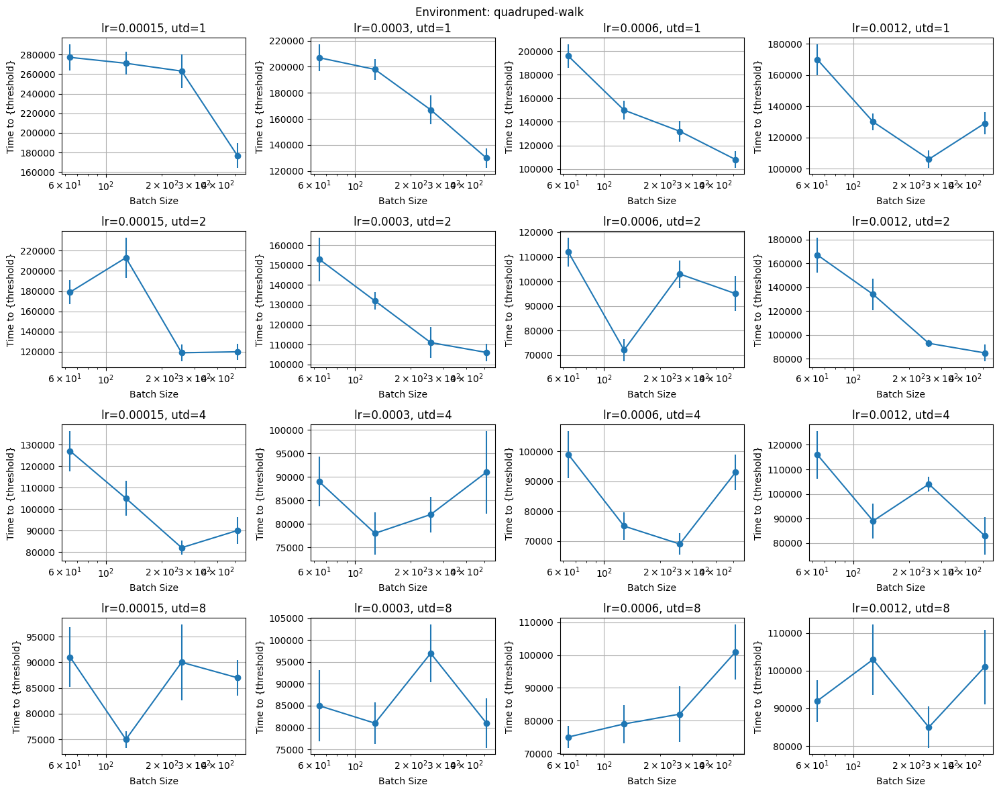

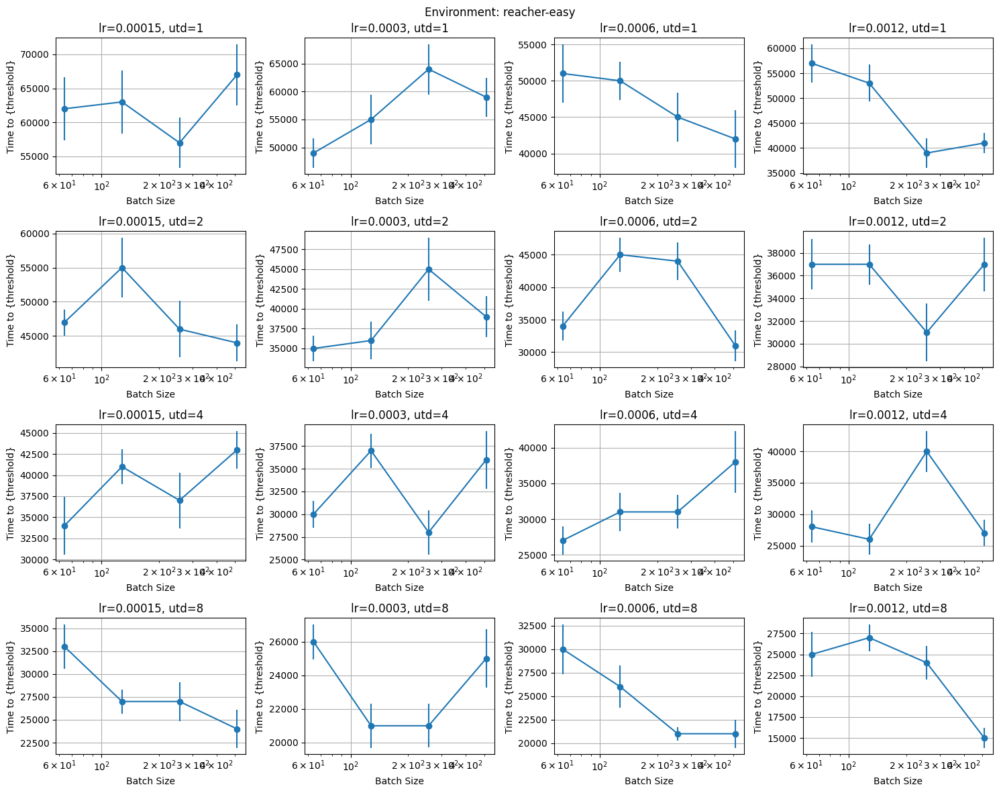

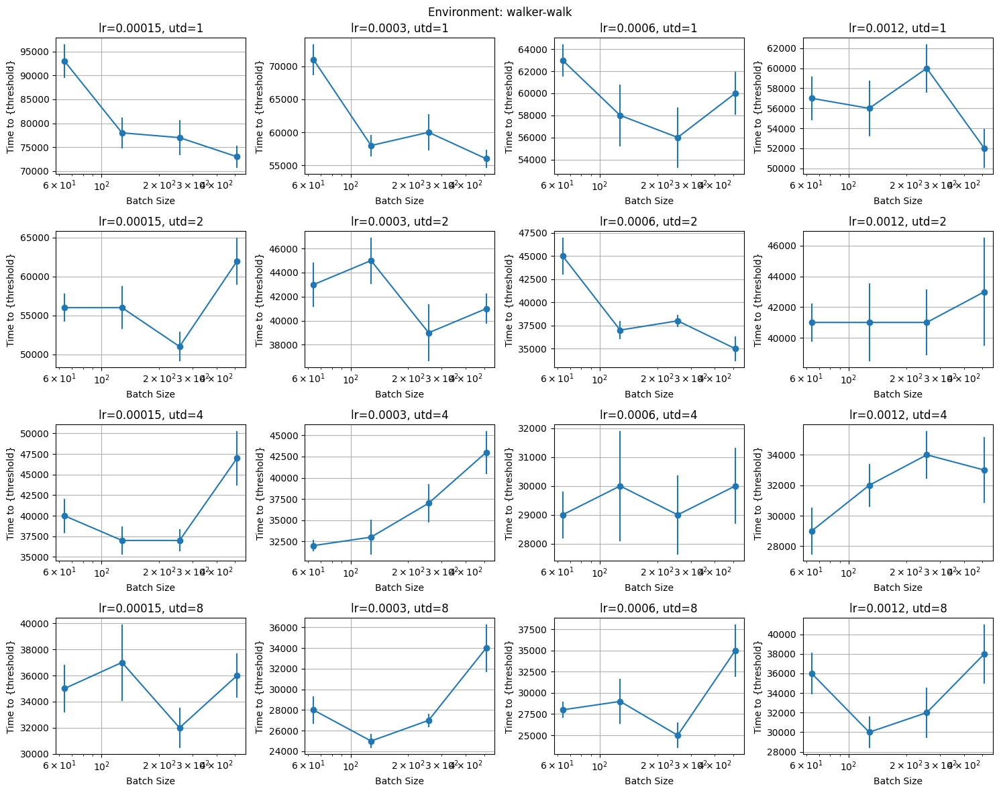

In [59]:
# Plot batch size vs performance for each environment separately
unique_envs = sorted(df['env_name'].unique())
unique_lrs = sorted(df['learning_rate'].unique())
unique_utds = sorted(df['utd'].unique())

for env in unique_envs:
    cols = 4
    rows = ((len(unique_lrs) * len(unique_utds)) + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(15, 3*rows))
    fig.suptitle(f'Environment: {env}')
    axs = axs.flatten()

    plot_idx = 0
    env_data = df[df['env_name'] == env]
    
    for utd in unique_utds:
        for lr in unique_lrs:
            data = env_data[(env_data['learning_rate'] == lr) & 
                           (env_data['utd'] == utd)]
            
            if len(data) == 0:
                continue
            
            # Group by batch size
            batch_groups = data.groupby('batch_size')
            threshold_i = -1
            threshold = thresholds[threshold_i]

            time_to_threshold = batch_groups.apply(lambda x: np.mean([r[threshold_i] for r in x['crossings']]))
            sem = batch_groups.apply(lambda x: np.mean([r[threshold_i] for r in x['crossings_sem']]))
            
            batch_sizes = sorted(batch_groups.groups.keys())
            means = [time_to_threshold[bs] for bs in batch_sizes]
            sems = [sem[bs] for bs in batch_sizes]
            axs[plot_idx].errorbar(batch_sizes, means, yerr=sems, fmt='o-')
            
            axs[plot_idx].set_xscale('log')
            axs[plot_idx].set_xlabel('Batch Size')
            axs[plot_idx].set_ylabel('Time to {threshold}')
            axs[plot_idx].set_title(f'lr={lr}, utd={utd}')
            axs[plot_idx].grid(True)
            
            plot_idx += 1
            
    # Hide empty subplots
    for idx in range(plot_idx, len(axs)):
        axs[idx].set_visible(False)

    plt.tight_layout()
    plt.show()


dog-stand 8 [0.0003, 0.00015, 0.00015, 0.00015] [467000.0, 691000.0, nan, nan] 0


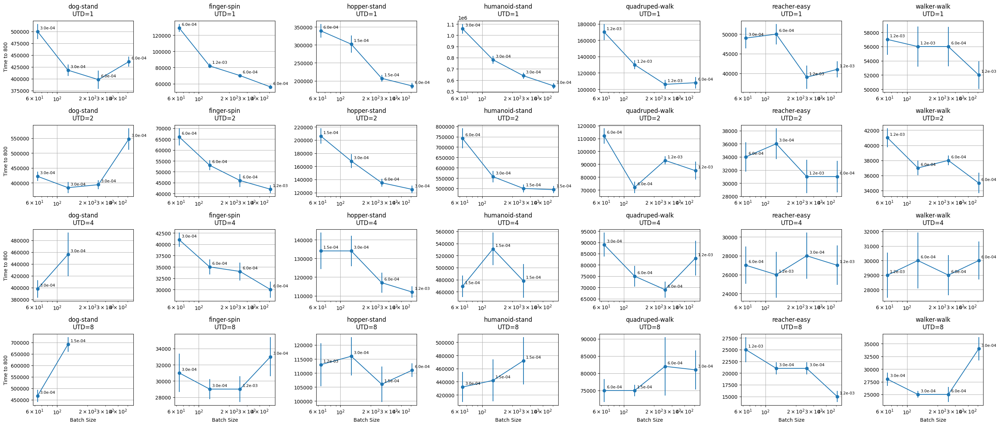

In [60]:
# Plot time to threshold vs batch size using optimal learning rates
unique_envs = sorted(df['env_name'].unique())
unique_utds = sorted(df['utd'].unique())

rows = len(unique_utds)
cols = len(unique_envs)
fig, axs = plt.subplots(rows, cols, figsize=(4*cols, 3*rows))

for row, utd in enumerate(unique_utds):
    for col, env in enumerate(unique_envs):
        env_data = df[(df['env_name'] == env) & (df['utd'] == utd)]
        
        # For each batch size, get data for optimal learning rate
        batch_sizes = sorted(env_data['batch_size'].unique())
        means = []
        sems = []
        optimal_lrs = []
        
        for bs in batch_sizes:
            batch_data = env_data[env_data['batch_size'] == bs]
            
            # Get data for optimal learning rate
            threshold_i = -1
            threshold = thresholds[threshold_i]
            
            times = [r[threshold_i] for r in batch_data['crossings']]
            errors = [r[threshold_i] for r in batch_data['crossings_sem']]
            lrs = batch_data['learning_rate'].values
            
            # Find minimum mean time across learning rates
            min_idx = np.argmin([np.mean(t) for t in times])
            means.append(np.mean(times[min_idx]))
            sems.append(np.mean(errors[min_idx]))
            optimal_lrs.append(lrs[min_idx])

        if env == 'dog-stand' and utd == 8:
            print(env, utd, optimal_lrs, means, min_idx)
        line = axs[row,col].errorbar(batch_sizes, means, yerr=sems, fmt='o-')
        axs[row,col].set_xscale('log')
        
        # Add learning rate annotations
        for i, (bs, lr) in enumerate(zip(batch_sizes, optimal_lrs)):
            axs[row,col].annotate(f'{lr:.1e}', 
                                (bs, means[i]),
                                xytext=(5, 5), 
                                textcoords='offset points',
                                fontsize=8)
        
        # Only add x-label for bottom row
        if row == rows-1:
            axs[row,col].set_xlabel('Batch Size')
        
        # Only add y-label for leftmost column    
        if col == 0:
            axs[row,col].set_ylabel(f'Time to {threshold}')
            
        # Add environment name as title for top row, UTD for all rows
        if row == 0:
            axs[row,col].set_title(f'{env}')
        axs[row,col].set_title(f'{env}\nUTD={utd}', pad=10)
        axs[row,col].grid(True)

plt.tight_layout()
plt.show()


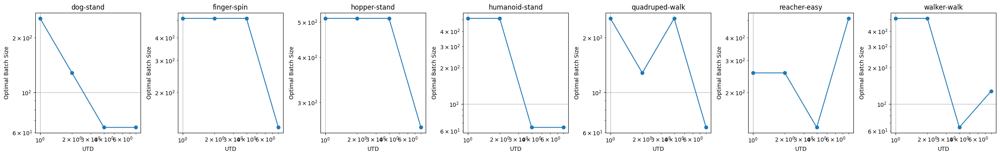

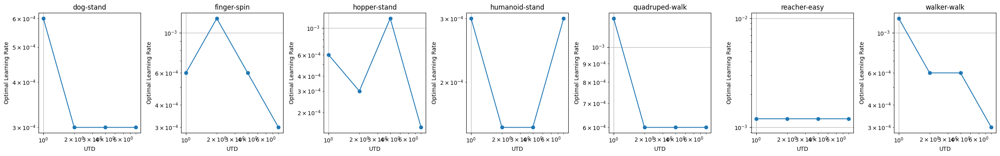

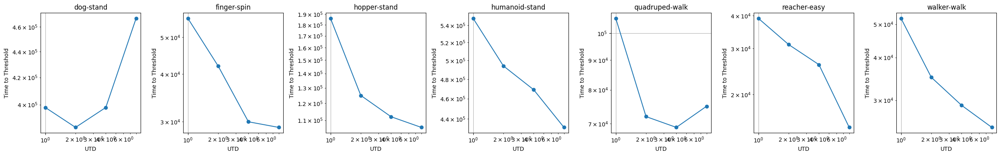

In [109]:
# use the table that has the optimal learning rates 

# make a table that only uses the optimal batch sizes
# Group by env_name and utd to find best batch size for each combination
df_best_lr_batch = df_best_lr.groupby(['env_name', 'utd']).apply(
    lambda x: x.loc[x['time_to_threshold'].idxmin()]
).reset_index(drop=True)

# Create subplots for each environment
envs = df_best_lr_batch['env_name'].unique()
n_envs = len(envs)

fig, axs = plt.subplots(1, 7, figsize=(25, 4))
axs = axs.flatten()

for i, env in enumerate(envs):
    env_data = df_best_lr_batch[df_best_lr_batch['env_name'] == env]
    axs[i].plot(env_data['utd'], env_data['batch_size'], 'o-')
    axs[i].set_xscale('log')
    axs[i].set_yscale('log')
    axs[i].set_xlabel('UTD')
    axs[i].set_ylabel('Optimal Batch Size')
    axs[i].set_title(f'{env}')
    axs[i].grid(True)

# Remove empty subplots
for j in range(i+1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

# Plot optimal learning rate vs UTD for each environment
fig, axs = plt.subplots(1, 7, figsize=(25, 4))
axs = axs.flatten()

for i, env in enumerate(envs):
    env_data = df_best_lr_batch[df_best_lr_batch['env_name'] == env]
    axs[i].plot(env_data['utd'], env_data['best_lr'], 'o-')
    axs[i].set_xscale('log')
    axs[i].set_yscale('log') 
    axs[i].set_xlabel('UTD')
    axs[i].set_ylabel('Optimal Learning Rate')
    axs[i].set_title(f'{env}')
    axs[i].grid(True)

# Remove empty subplots
for j in range(i+1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()


# Plot time to threshold vs batch size for each environment and UTD value
fig, axs = plt.subplots(1, 7, figsize=(25, 4))
axs = axs.flatten()

for i, env in enumerate(envs):
    env_data = df_best_lr_batch[df_best_lr_batch['env_name'] == env]
    axs[i].plot(env_data['utd'], env_data['time_to_threshold'], 'o-')
    axs[i].set_xscale('log')
    axs[i].set_yscale('log')
    axs[i].set_xlabel('UTD')
    axs[i].set_ylabel('Time to Threshold')
    axs[i].set_title(f'{env}')
    axs[i].grid(True)

# Remove empty subplots
for j in range(i+1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()


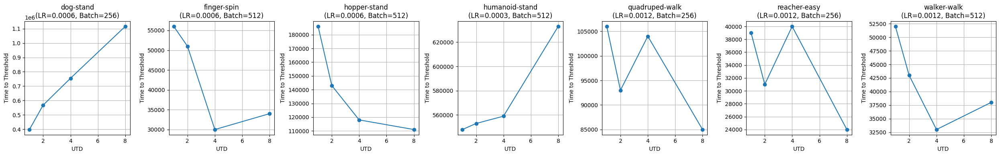

In [108]:
# Plot time to threshold for each environment using subplots
n_envs = len(envs)

fig, axs = plt.subplots(1, 7, figsize=(25, 4))
axs = axs.flatten()

for i, env in enumerate(envs):
    # Get optimal learning rate and batch size for UTD=1 for this env
    utd_1_data = df_best_lr_batch[(df_best_lr_batch['utd'] == 1) & 
                                 (df_best_lr_batch['env_name'] == env)]
    utd_1_lr = utd_1_data['best_lr'].values[0]
    utd_1_batch = utd_1_data['batch_size'].values[0]

    # Filter data for UTD=1 learning rate and batch size for this env
    df_utd1 = df[
        (df['learning_rate'] == utd_1_lr) & 
        (df['batch_size'] == utd_1_batch) &
        (df['env_name'] == env)
    ]

    # Sort by UTD values
    df_utd1_sorted = df_utd1.sort_values('utd')

    axs[i].plot(df_utd1_sorted['utd'], [x[-1] for x in df_utd1_sorted['crossings'].values], 'o-')
    axs[i].set_xlabel('UTD')
    axs[i].set_ylabel('Time to Threshold')
    axs[i].set_title(f'{env}\n(LR={utd_1_lr}, Batch={utd_1_batch})')
    axs[i].grid(True)

# Remove empty subplots
for j in range(i+1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()



In [80]:
utd_1_lr

NameError: name 'utd_1_lr' is not defined

  0%|          | 0/125 [00:00<?, ?it/s]/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in power
  # Remove the CWD from sys.path while we load stuff.
100%|██████████| 125/125 [00:01<00:00, 90.01it/s]


loss 0.007633970780512636
y = 8.77e+00 / (1 + x/2.57e-03)^-2.62e-01


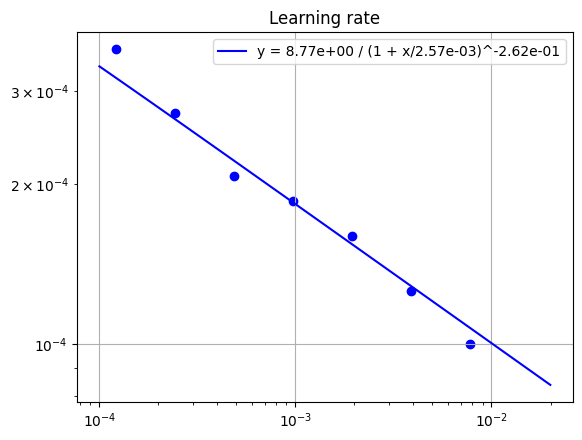

In [146]:
# large-batch training - fit() - uncertainty-corrected

def lr_rule_min(args, *params):
    x,y = params
    a,b,c = args
    return ((lr_rule(x,a,b,c) - y) ** 2).mean()
    # return ((np.log(lr_rule(x,a,b,c) / y)) ** 2).mean()

def lr_rule(x, a, b, c):
    return c * (1 + x/b) ** (-a)

n_parallel = np.array([128, 1024, 2048, 4096, 8192, 16384, 32768, 65536])
utd = 1/n_parallel * 8
learning_rate = np.array([4e-5, 1e-4, 1.26e-4, 1.6e-4, 2e-4, 2e-4, 2.5e-4, 3.7e-4])
learning_rate = np.array([4e-5, 1e-4, 1.26e-4, 1.6e-4, 1.86e-4, 2.07e-4, 2.73e-4, 3.6e-4]) # uncertainty corrected
fit_data_points = [3, 4, 5, 6]
plot_data_points = [1, 2, 3, 4, 5, 6, 7]
tried_values = [[4e-5], [1e-4, 2e-4], [1.26e-4, 1e-4, 2e-4], [1.6e-4, 1e-4, 2e-4], [2e-4, 1e-4], [2e-4, 2.5e-4, 3.2e-4], [2.5e-4, 2e-4], [3.2e-4, 2.7e-4, 3.7e-4]]

scaling = [1000, 10000]
fitted_params = fit(utd[fit_data_points] * scaling[0], learning_rate[fit_data_points] * scaling[1], lr_rule_min,
                     [slice(-4, 4, 1.6),slice(1e-5, 5e-4, 1e-4),slice(-10, 10, 4)], maxiter=100)
print('loss', lr_rule_min(fitted_params, utd[fit_data_points] * scaling[0], learning_rate[fit_data_points] * scaling[1]))
a, b, c = fitted_params
x_smooth = np.logspace(-1, 1.3, 100)
y_fitted = lr_rule(x_smooth, a, b, c)

# for i, lr_tried in enumerate(tried_values):
#     if i in plot_data_points:
#         plt.scatter([utd[i]]*len(lr_tried), lr_tried, color='lightblue')    
plt.title('Learning rate')
plt.scatter(utd[plot_data_points], learning_rate[plot_data_points], color='blue')
plt.plot(x_smooth / scaling[0], y_fitted / scaling[1], 'b-', label=f'y = {c:.2e} / (1 + x/{b:.2e})^-{a:.2e}')
print(f'y = {c:.2e} / (1 + x/{b:.2e})^-{a:.2e}')
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.legend()
plt.show()

In [25]:
# Extrapolate

def get_lr(n_parallel):
    utd = 8/n_parallel * scaling[0]  # Scale UTD ratio same as training data
    predicted_lr = lr_rule(utd, a, b, c) / scaling[1]  # Unscale the prediction
    return predicted_lr

print(f'Predicted learning rate for n_parallel=131072: {get_lr(131072):.2e}')
print(f'Predicted learning rate for n_parallel=65536: {get_lr(65536):.2e}')
print(f'Predicted learning rate for n_parallel=32768: {get_lr(32768):.2e}')


Predicted learning rate for n_parallel=131072: 3.78e-04
Predicted learning rate for n_parallel=65536: 3.18e-04
Predicted learning rate for n_parallel=32768: 2.67e-04


  0%|          | 0/125 [00:00<?, ?it/s]/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in power
  # Remove the CWD from sys.path while we load stuff.
100%|██████████| 125/125 [00:01<00:00, 104.89it/s]


loss 0.0025927195200633993



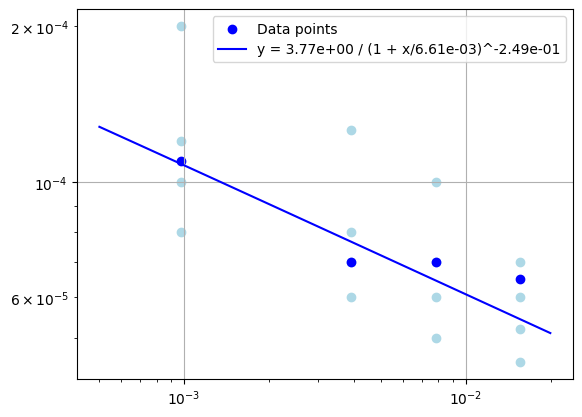

In [8]:
# Pushing, 2x width - fit


n_parallel = np.array([512, 1024, 2048, 8192])
utd = 1/n_parallel * 8
learning_rate = np.array([6e-5, 7e-5, 7e-5, 1e-4])
learning_rate = np.array([6.5e-5, 7e-5, 7e-5, 1.1e-4]) # uncertainty corrected
fit_data_points = [1, 2, 3]
plot_data_points = [0, 1, 2, 3]
lr_tried_values = [[6e-5, 7e-5], [5e-5, 1e-4], [6e-5, 1.26e-4], [1e-4, 2e-4]]
lr_tried_values = [[5.2e-5, 4.5e-5, 6e-5, 7e-5], [5e-5, 6e-5, 7e-5, 1e-4], [6e-5, 7e-5, 8e-5, 1.26e-4], [1.2e-4, 8e-5, 1e-4, 2e-4]] # values to try

scaling = [1000, 10000]
fitted_params = fit(utd[fit_data_points] * scaling[0], learning_rate[fit_data_points] * scaling[1], lr_rule_min,
                     [slice(-4, 4, 1.6),slice(1e-5, 5e-4, 1e-4),slice(-10, 10, 4)], maxiter=100)
print('loss', lr_rule_min(fitted_params, utd[fit_data_points] * scaling[0], learning_rate[fit_data_points] * scaling[1]))
a, b, c = fitted_params
x_smooth = np.logspace(-0.3, 1.3, 100)
y_fitted = lr_rule(x_smooth, a, b, c)

for i, lr_tried in enumerate(lr_tried_values):
    plt.scatter([utd[i]]*len(lr_tried), lr_tried, color='lightblue')
plt.scatter(utd[plot_data_points], learning_rate[plot_data_points], color='blue', label='Data points')
plt.plot(x_smooth / scaling[0], y_fitted / scaling[1], 'b-', label=f'y = {c:.2e} / (1 + x/{b:.2e})^-{a:.2e}')
print()
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.legend()
plt.show()

In [70]:
# Extrapolate

def get_lr(n_parallel):
    utd = 8/n_parallel * scaling[0]  # Scale UTD ratio same as training data
    predicted_lr = lr_rule(utd, a, b, c) / scaling[1]  # Unscale the prediction
    return predicted_lr

print(f'Predicted learning rate for n_parallel=256: {get_lr(256):.2e}')
print(f'Predicted learning rate for n_parallel=512: {get_lr(512):.2e}')
print(f'Predicted learning rate for n_parallel=1024: {get_lr(1024):.2e}')
print(f'Predicted learning rate for n_parallel=2048: {get_lr(2048):.2e}')
print(f'Predicted learning rate for n_parallel=4096: {get_lr(4096):.2e}')
print(f'Predicted learning rate for n_parallel=8192: {get_lr(8192):.2e}')


Predicted learning rate for n_parallel=256: 4.49e-05
Predicted learning rate for n_parallel=512: 5.24e-05
Predicted learning rate for n_parallel=1024: 6.12e-05
Predicted learning rate for n_parallel=2048: 7.14e-05
Predicted learning rate for n_parallel=4096: 8.33e-05
Predicted learning rate for n_parallel=8192: 9.73e-05


27.472123918445998
0.0021486636720810383 loss
y = -1.73e+00 + (x/2.73e+04)^-1.24e-01


/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in power
  import sys
/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in log
  """


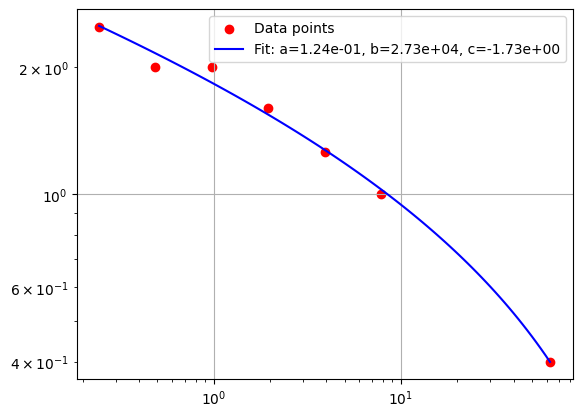

In [14]:
# learning rate - minimize()

n_parallel = np.array([128, 1024, 2048, 4096, 8192, 16384, 32768])/1000
utd = 1/n_parallel * 8
learning_rate = np.array([4e-5, 1e-4, 1.26e-4, 1.6e-4, 2e-4, 2e-4, 2.5e-4]) * 10000

optim_f = power_law_with_const_min
current_params = [-2.50000000e+00,  4.75000000e+00,  1e-04]
print(optim_f(current_params, utd, learning_rate))
lbfgs_pred = scipy.optimize.minimize(optim_f, current_params, args=((utd,), learning_rate), method='L-BFGS-B', tol=1e-10).x
# print(lbfgs_pred)
print(optim_f(lbfgs_pred, utd, learning_rate), 'loss')

# Plot the fit
x_smooth = np.logspace(np.log10(np.min(utd)), np.log10(np.max(utd)), 100)
y_fitted = power_law_with_const(x_smooth, *lbfgs_pred)

plt.figure()
plt.scatter(utd, learning_rate, color='red', label='Data points')
plt.plot(x_smooth, y_fitted, 'b-', label=f'Fit: a={lbfgs_pred[0]:.2e}, b={lbfgs_pred[1]:.2e}, c={lbfgs_pred[2]:.2e}')
print(f'y = {lbfgs_pred[2]:.2e} + (x/{lbfgs_pred[1]:.2e})^-{lbfgs_pred[0]:.2e}')
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.legend()
plt.show()



  6%|▋         | 8/125 [00:00<00:03, 36.07it/s]/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in log
  """
 26%|██▋       | 33/125 [00:00<00:01, 47.86it/s]/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in power
  import sys
100%|██████████| 125/125 [00:02<00:00, 52.97it/s]


0.002654084755498555 loss
y = -1.30e+00 + (x/2.80e+03)^-1.43e-01


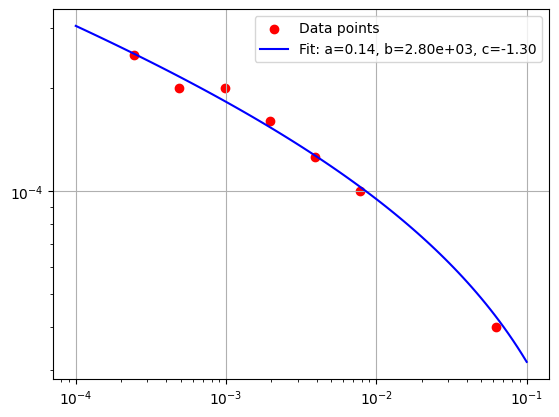

In [21]:
# learning rate - fit()

n_parallel = np.array([128, 1024, 2048, 4096, 8192, 16384, 32768])
utd = 1/n_parallel * 8
learning_rate = np.array([4e-5, 1e-4, 1.26e-4, 1.6e-4, 2e-4, 2e-4, 2.5e-4])
fit_data_points = [1, 2, 3, 4, 5, 6]

rescaling = [1000, 10000]
fitted_params = fit(utd[fit_data_points] * rescaling[0], learning_rate[fit_data_points] * rescaling[1], power_law_with_const_min,
                     [slice(-4, 4, 1.6),slice(1, 10, 2),slice(1e-5, 5e-4, 1e-4)], disp=False, maxiter=100)
print(power_law_with_const_min(fitted_params, utd[fit_data_points] * rescaling[0], learning_rate[fit_data_points] * rescaling[1]), 'loss')

x_smooth = np.logspace(-1, 2, 100)
a, b, c = fitted_params
y_fitted = power_law_with_const(x_smooth, a, b, c)

plt.scatter(utd, learning_rate, color='red', label='Data points')
plt.plot(x_smooth / rescaling[0], y_fitted / rescaling[1], 'b-', label=f'Fit: a={a:.2f}, b={b:.2e}, c={c:.2f}')
print(f'y = {c:.2e} + (x/{b:.2e})^-{a:.2e}')
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.legend()
plt.show()



/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in log
  # Remove the CWD from sys.path while we load stuff.
/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in log
  # Remove the CWD from sys.path while we load stuff.
/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in log
  # Remove the CWD from sys.path while we load stuff.
/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in log
  # Remove the CWD from sys.path while we load stuff.
/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in log
  # Remove the CWD from sys.path while we load stuff.
/home/oleh/miniconda3/envs/rlgpu/lib/python3.7/sit

loss 0.41987349469597063
y = 2.00e+00 / (1 + x/1.09e-05)^-8.00e-01


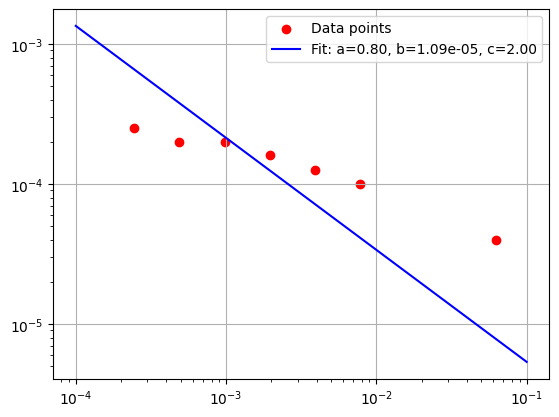

In [30]:
# large-batch training - log space - fit()

def lr_rule_min(args, *params):
    x,y = params
    a,b,c = args
    return ((log_lr_rule(x,a,b,c) - np.log(y)) ** 2).mean()
    # return ((np.log(lr_rule(x,a,b,c) / y)) ** 2).mean()

def log_lr_rule(x, a, b, c):
    return np.log(c) - a * np.log(1 + x/b)

n_parallel = np.array([128, 1024, 2048, 4096, 8192, 16384, 32768])
utd = 1/n_parallel * 8
learning_rate = np.array([4e-5, 1e-4, 1.26e-4, 1.6e-4, 2e-4, 2e-4, 2.5e-4])
fit_data_points = [1, 2, 3, 4, 5, 6]

scaling = [1000, 1]
fitted_params = fit(utd[fit_data_points] * scaling[0], learning_rate[fit_data_points] * scaling[1], lr_rule_min,
                     [slice(-4, 4, 1.6),slice(1e-5, 5e-4, 1e-4),slice(-10, 10, 4)], maxiter=100)
print('loss', lr_rule_min(fitted_params, utd[fit_data_points] * scaling[0], learning_rate[fit_data_points] * scaling[1]))
a, b, c = fitted_params
x_smooth = np.logspace(-1, 2, 100)
y_fitted = np.exp(log_lr_rule(x_smooth, a, b, c))

plt.scatter(utd, learning_rate, color='red', label='Data points')
plt.plot(x_smooth / scaling[0], y_fitted / scaling[1], 'b-', label=f'Fit: a={a:.2f}, b={b:.2e}, c={c:.2f}')
print(f'y = {c:.2e} / (1 + x/{b:.2e})^-{a:.2e}')
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.legend()
plt.show()

In [18]:
daily_prob = 1e-2
total_days = 8 * 365 / 3
total_prob = 1 - (1 - daily_prob) ** total_days
total_prob


0.9999435596876843